<b><font color="SteelBlue" size="+3">Segmentez des clients d'un site e-commerce</font></b>

# Introduction

Ce notebook est la suite de l'EDA réalisé pour OLIST. Ici nous allons procéder aux tests pour choisir le meilleur modèle de clustering.

## Imports

In [162]:
# Chargement des librairies
# Builtin
import os

# Data
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from math import pi, ceil



# Clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

## Data

In [169]:
os.listdir()

['.ipynb_checkpoints',
 'Brazil_Regions.png',
 'carte-bresil.jpg',
 'Carte_bresil.png',
 'data',
 'Deveau_Estelle_1_script_032024.sql',
 'Deveau_Estelle_2_notebook_exploration_032024.ipynb',
 'Deveau_Estelle_3_notebook_essais_032024.ipynb',
 'Deveau_Estelle_4_notebook_simulation_032024.ipynb',
 'svg']

In [170]:
os.listdir("data/cleaned/")

['data.csv', 'data_ACP.csv', 'data_clean_non_normal.csv']

In [171]:
path     = "./data/cleaned/"
filename1 = "data.csv"


In [172]:
data = pd.read_csv(path + filename1)

In [173]:
filename2 = "data_clean_non_normal.csv"
data_clean_non_normal = pd.read_csv(path + filename2)

In [174]:
# Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Quick tour

In [175]:
data.head()

,Recency,Frequency,AvgBasket,item_count,AverageReviewScore,EngagementIndex,ActualDeliveryTime,EstimatedActualDifference,AvgWeight,TotalInstallments,boleto_pct,voucher_pct,Region_CentreOuest,Region_Nord,Region_NordEst,Region_Sud,Region_SudEst
0,-0.823824,-0.166833,-0.083401,-0.262544,0.661413,1.581544,-0.646417,-0.700191,-0.160957,1.669969,-0.50049,-0.18714,0.0,0.0,0.0,0.0,1.0
1,-0.804152,-0.166833,-0.609331,-0.262544,-0.120032,-0.489226,-0.976784,-0.688748,-0.462852,-0.701200,-0.50049,-0.18714,0.0,0.0,0.0,0.0,1.0
2,1.963167,-0.166833,-0.338687,-0.262544,-0.901478,-0.489226,1.395680,-0.972637,-0.160957,1.669969,-0.50049,-0.18714,0.0,0.0,0.0,1.0,0.0
3,0.546720,-0.166833,-0.534002,-0.262544,-0.120032,0.546159,0.793777,-0.007344,-0.523231,0.315015,-0.50049,-0.18714,0.0,1.0,0.0,0.0,0.0
4,0.330318,-0.166833,0.168721,-0.262544,0.661413,-0.489226,0.064905,-0.411915,1.060043,0.992492,-0.50049,-0.18714,0.0,0.0,0.0,0.0,1.0


In [176]:
data.shape

(92411, 17)

In [177]:
data.dtypes.value_counts()

float64    17
Name: count, dtype: int64

In [161]:
data.describe()

,Recency,Frequency,AvgBasket,item_count,AverageReviewScore,EngagementIndex,ActualDeliveryTime,EstimatedActualDifference,AvgWeight,TotalInstallments,boleto_pct,voucher_pct,Region_CentreOuest,Region_Nord,Region_NordEst,Region_Sud,Region_SudEst
count,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,9.241100e+04,92411.000000,92411.000000,92411.000000,92411.000000,92411.000000
mean,5.843595e-18,-2.792623e-16,-1.599300e-17,1.730012e-16,-2.245171e-17,-1.089523e-16,-7.823498e-17,1.276364e-17,1.580077e-17,1.653122e-18,-2.629618e-17,3.690692e-17,0.058402,0.018634,0.094210,0.143446,0.685308
std,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.234504,0.135230,0.292122,0.350529,0.464396
min,-1.551721e+00,-1.668332e-01,-6.900248e-01,-2.625435e-01,-2.464370e+00,-2.456457e+00,-1.267677e+00,-1.987925e+01,-5.634840e-01,-1.039939e+00,-5.004897e-01,-1.871402e-01,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-8.107091e-01,-1.668332e-01,-4.480356e-01,-2.625435e-01,-1.200325e-01,-4.892259e-01,-6.076500e-01,-4.739649e-01,-4.829785e-01,-7.012004e-01,-5.004897e-01,-1.871402e-01,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-1.221582e-01,-1.668332e-01,-2.495567e-01,-2.625435e-01,6.614135e-01,-4.892259e-01,-2.437057e-01,6.909324e-02,-3.756379e-01,-3.624619e-01,-5.004897e-01,-1.871402e-01,0.000000,0.000000,0.000000,0.000000,1.000000
75%,7.106604e-01,-1.668332e-01,7.465062e-02,-2.625435e-01,6.614135e-01,5.461590e-01,3.315297e-01,5.012625e-01,-7.374238e-02,3.150149e-01,-5.004897e-01,-1.871402e-01,0.000000,0.000000,0.000000,0.000000,1.000000
max,2.999272e+00,3.848493e+01,6.191398e+01,3.772088e+01,6.614135e-01,1.918309e+01,2.069783e+01,1.339134e+01,1.028463e+01,2.063932e+01,2.005441e+00,6.125951e+00,1.000000,1.000000,1.000000,1.000000,1.000000


In [121]:
data.nunique()

Recency                        610
Frequency                        8
AvgBasket                    30063
item_count                      17
AverageReviewScore              32
EngagementIndex                 64
ActualDeliveryTime           90854
EstimatedActualDifference    88408
AvgWeight                     3220
TotalInstallments               39
boleto_pct                     242
voucher_pct                   2157
Region_CentreOuest               2
Region_Nord                      2
Region_NordEst                   2
Region_Sud                       2
Region_SudEst                    2
dtype: int64

In [122]:
# Valeurs manquantes
missing_values_count = data.isnull().sum()
total_cells = np.product(data.shape)
total_missing = missing_values_count.sum()
percent_missing = (total_missing/total_cells) * 100
print('Le pourcentage de valeurs manquantes est de', round(percent_missing, 2),'%')

Le pourcentage de valeurs manquantes est de 0.0 %


In [123]:
percent_missing_values =  round((missing_values_count / len(data)) * 100, 2)
missing_data = pd.concat([missing_values_count, percent_missing_values], axis=1, keys=['Nombre de valeurs manquantes', 'Pourcentage de valeurs manquantes'])
display(missing_data)

,Nombre de valeurs manquantes,Pourcentage de valeurs manquantes
Recency,0,0.0
Frequency,0,0.0
AvgBasket,0,0.0
item_count,0,0.0
AverageReviewScore,0,0.0
EngagementIndex,0,0.0
ActualDeliveryTime,0,0.0
EstimatedActualDifference,0,0.0
AvgWeight,0,0.0
TotalInstallments,0,0.0


# 12 indicateurs

In [124]:
# features à supprimer
data = data.drop(columns=[
 'Region_CentreOuest',
 'Region_Nord',
 'Region_NordEst',
 'Region_Sud',
 'Region_SudEst'   
])


In [125]:
data.columns.tolist()

['Recency',
 'Frequency',
 'AvgBasket',
 'item_count',
 'AverageReviewScore',
 'EngagementIndex',
 'ActualDeliveryTime',
 'EstimatedActualDifference',
 'AvgWeight',
 'TotalInstallments',
 'boleto_pct',
 'voucher_pct']

In [126]:
features = data.columns

## Test de différentes méthodes

### K-means

In [127]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=5, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

data.head()


,Recency,Frequency,AvgBasket,item_count,AverageReviewScore,EngagementIndex,ActualDeliveryTime,EstimatedActualDifference,AvgWeight,TotalInstallments,boleto_pct,voucher_pct,Cluster_kmeans
0,-0.823824,-0.166833,-0.083401,-0.262544,0.661413,1.581544,-0.646417,-0.700191,-0.160957,1.669969,-0.50049,-0.18714,0
1,-0.804152,-0.166833,-0.609331,-0.262544,-0.120032,-0.489226,-0.976784,-0.688748,-0.462852,-0.701200,-0.50049,-0.18714,0
2,1.963167,-0.166833,-0.338687,-0.262544,-0.901478,-0.489226,1.395680,-0.972637,-0.160957,1.669969,-0.50049,-0.18714,1
3,0.546720,-0.166833,-0.534002,-0.262544,-0.120032,0.546159,0.793777,-0.007344,-0.523231,0.315015,-0.50049,-0.18714,0
4,0.330318,-0.166833,0.168721,-0.262544,0.661413,-0.489226,0.064905,-0.411915,1.060043,0.992492,-0.50049,-0.18714,0


In [128]:
score = silhouette_score(data[features], data['Cluster_kmeans'], n_jobs=-1)
print('Silhouette Score:', score)


Silhouette Score: 0.22773658017481008


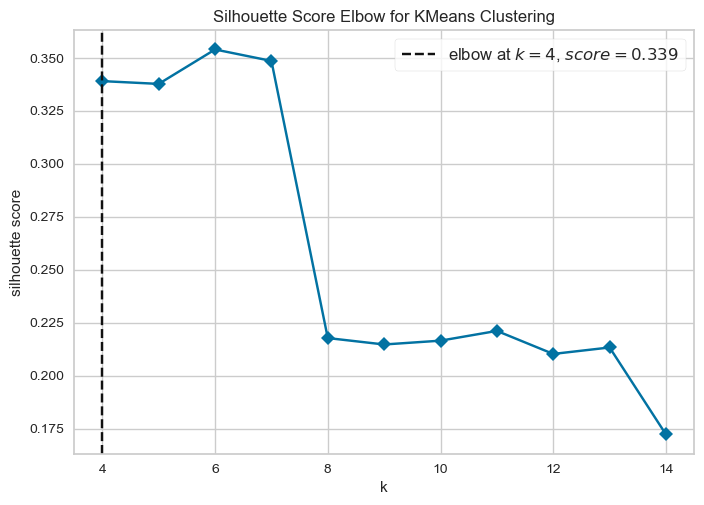

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [129]:
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,15), metric='silhouette', timings=False, n_jobs=-1)
visualizer.fit(data)    
visualizer.show()

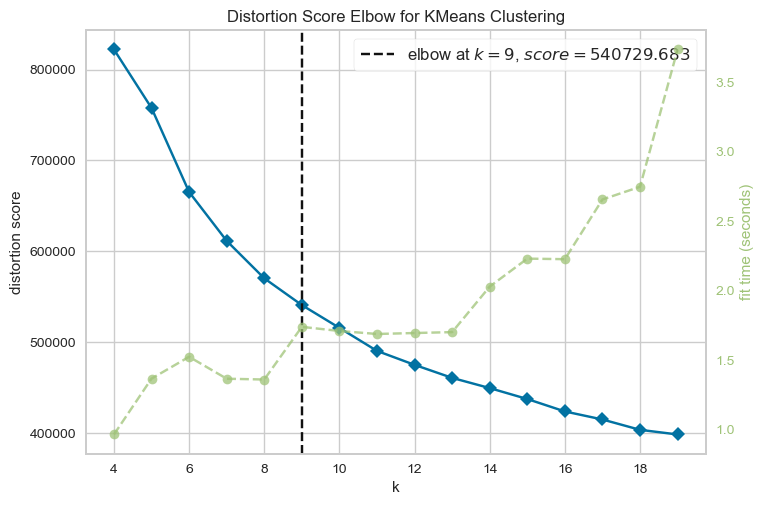

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [22]:
# distortion 
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,20))
visualizer.fit(data)   
visualizer.poof()   

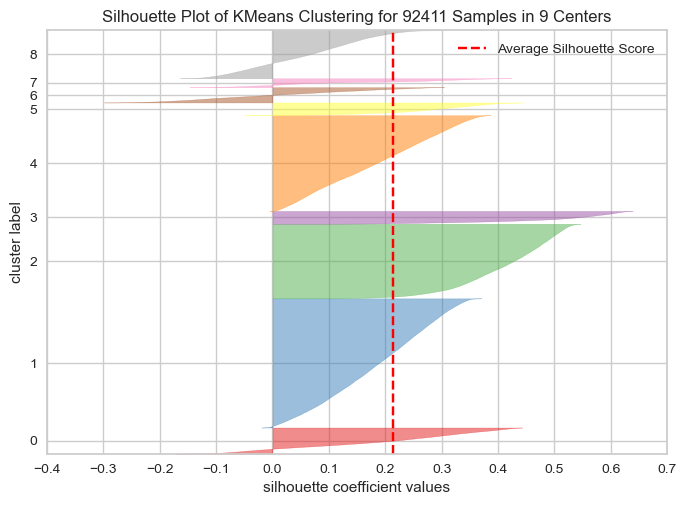

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 92411 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [23]:
visualizer = SilhouetteVisualizer(KMeans(n_clusters=9, random_state=42, n_init=10))
visualizer.fit(data)
visualizer.show()

In [24]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=9, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

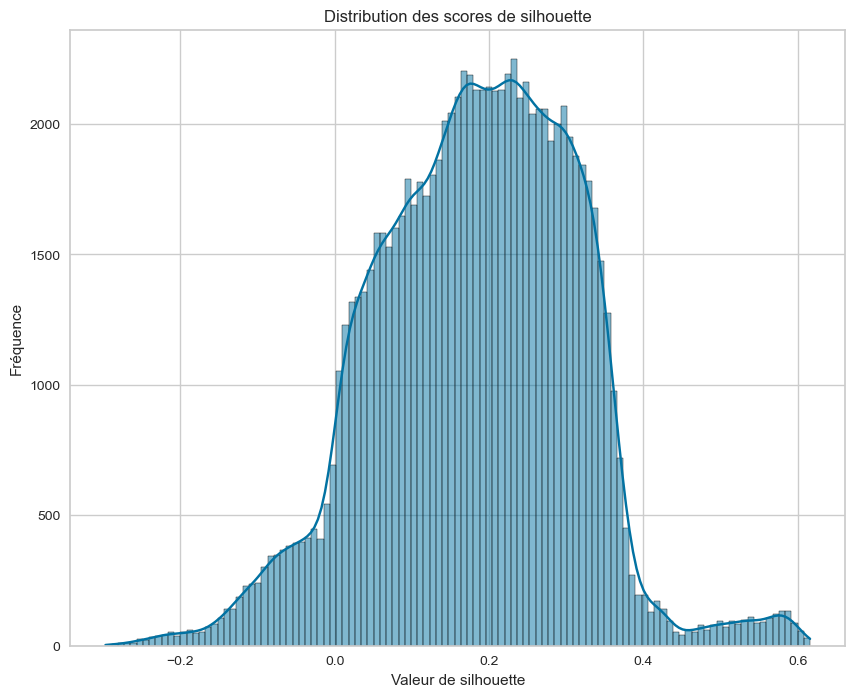

In [25]:
# Calculer les scores de silhouette pour chaque échantillon
sample_silhouette_values = silhouette_samples(data[features], data['Cluster_kmeans'], n_jobs=-1)

plt.figure(figsize=(10, 8))
sns.histplot(sample_silhouette_values, kde=True)
plt.title('Distribution des scores de silhouette')
plt.xlabel('Valeur de silhouette')
plt.ylabel('Fréquence')
plt.show()

In [26]:
# Calculer le score de Davies-Bouldin
X = data[features] 
labels = data['Cluster_kmeans'] 
davies_bouldin = davies_bouldin_score(X, labels)

print(f"Le score de Davies-Bouldin pour le clustering KMeans est : {davies_bouldin}")

Le score de Davies-Bouldin pour le clustering KMeans est : 1.4036319289957


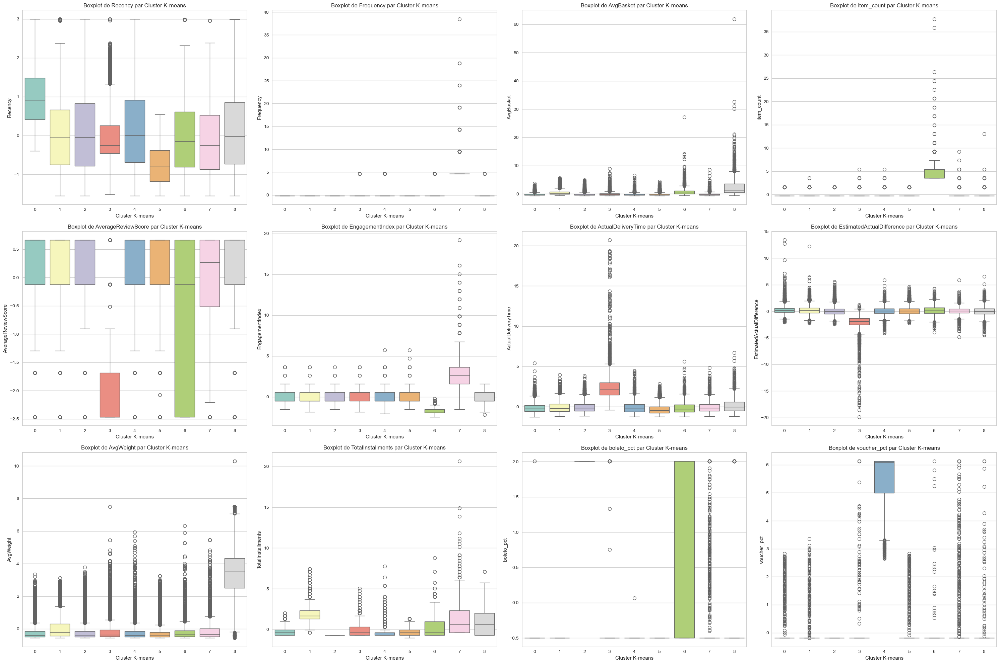

In [27]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_kmeans', y=column, data=data, ax=ax, palette='Set3', hue='Cluster_kmeans', legend=False)
    ax.set_xlabel('Cluster K-means')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means")

# Affichez les graphiques
plt.tight_layout()
plt.show()


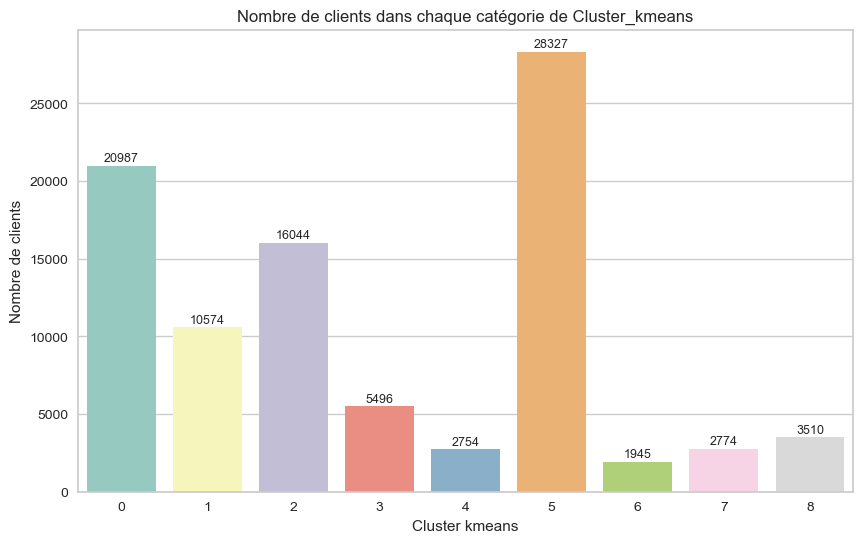

In [28]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_kmeans'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set3', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster kmeans')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de Cluster_kmeans')
plt.show()

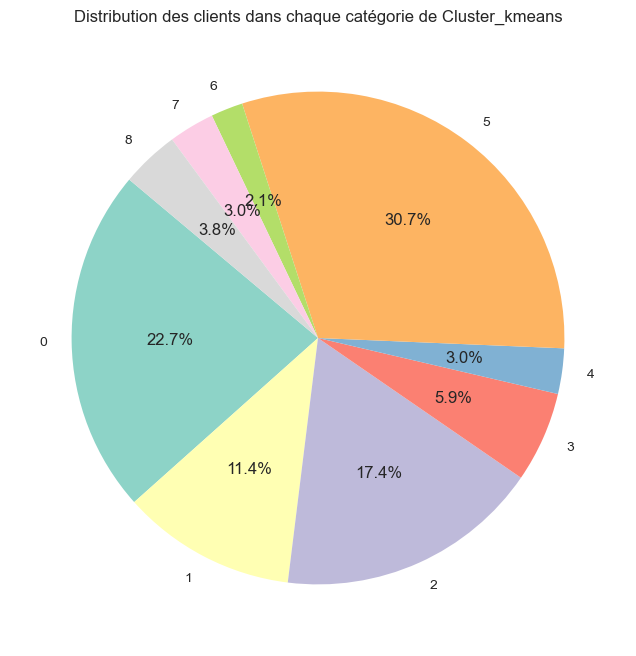

In [29]:
cluster_counts = data['Cluster_kmeans'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set3', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster_kmeans')
plt.show()

### DBSCAN

In [30]:
# Initialisation du modèle DBSCAN
dbscan = DBSCAN(eps=1.6, min_samples=200, n_jobs=-1)  
dbscan.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_DB'] = dbscan.labels_  # -1 = bruit


In [32]:
score = silhouette_score(data[features], data['Cluster_DB'], n_jobs=-1)
print('Silhouette Score:', score)

Silhouette Score: 0.1403792854614726


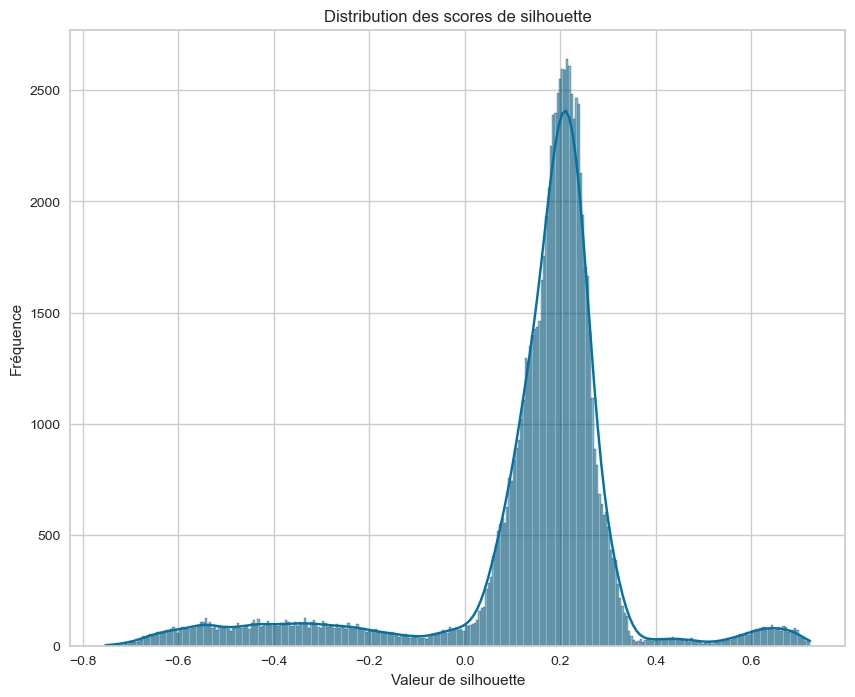

In [33]:
# Calculer les scores de silhouette pour chaque échantillon
sample_silhouette_values = silhouette_samples(data[features], data['Cluster_DB'], n_jobs=-1)

plt.figure(figsize=(10, 8))
sns.histplot(sample_silhouette_values, kde=True)
plt.title('Distribution des scores de silhouette')
plt.xlabel('Valeur de silhouette')
plt.ylabel('Fréquence')
plt.show()


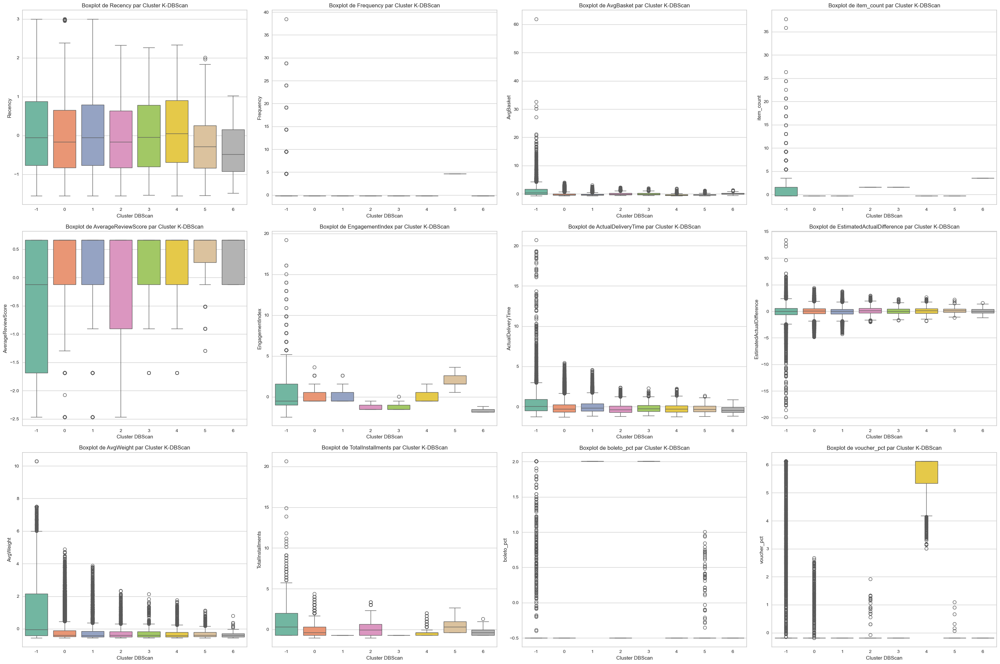

In [34]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_DB', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_DB', legend=False)
    ax.set_xlabel('Cluster DBScan')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-DBScan")

# Affichez les graphiques
plt.tight_layout()
plt.show()

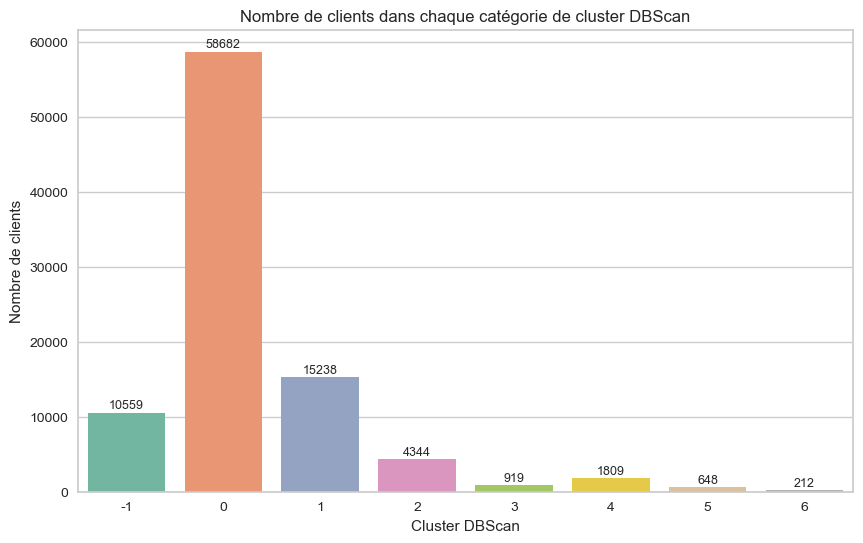

In [35]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_DB'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster DBScan')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster DBScan')

plt.show()

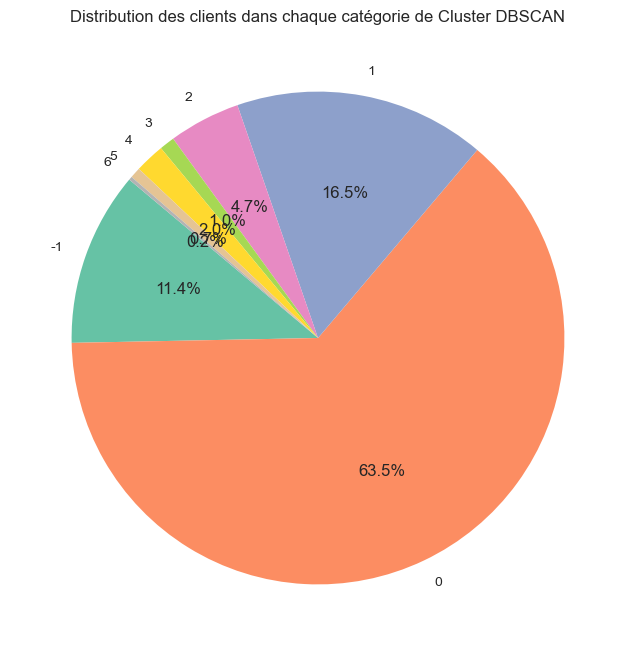

In [36]:
cluster_counts = data['Cluster_DB'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster DBSCAN')
plt.show()

### K-means + hierarchique

In [37]:
# Effectuer K-means avec 500 clusters
kmeans = KMeans(n_clusters=500, n_init=10, random_state=42)
kmeans.fit(data)

# Obtenir les centroids des clusters K-means
kmeans_centroids = kmeans.cluster_centers_

In [38]:
range_n_clusters = range(6, 15)  

In [39]:
# Ward
ward_silhouette_scores = []
for n_clusters in range_n_clusters:
    # Créer et ajuster le modèle AgglomerativeClustering
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(kmeans_centroids)
    
    # Calculer le score de silhouette
    silhouette_avg = silhouette_score(kmeans_centroids, cluster_labels)
    ward_silhouette_scores.append(silhouette_avg)
    print(f"Pour n_clusters = {n_clusters}, le score de silhouette moyen est : {silhouette_avg}")

Pour n_clusters = 6, le score de silhouette moyen est : 0.37649567202900924
Pour n_clusters = 7, le score de silhouette moyen est : 0.36517850623163156
Pour n_clusters = 8, le score de silhouette moyen est : 0.22995927770873945
Pour n_clusters = 9, le score de silhouette moyen est : 0.25568493525103475
Pour n_clusters = 10, le score de silhouette moyen est : 0.25604280958469927
Pour n_clusters = 11, le score de silhouette moyen est : 0.27358745250279914
Pour n_clusters = 12, le score de silhouette moyen est : 0.2868861729514691
Pour n_clusters = 13, le score de silhouette moyen est : 0.28927620997274234
Pour n_clusters = 14, le score de silhouette moyen est : 0.28980002235425073


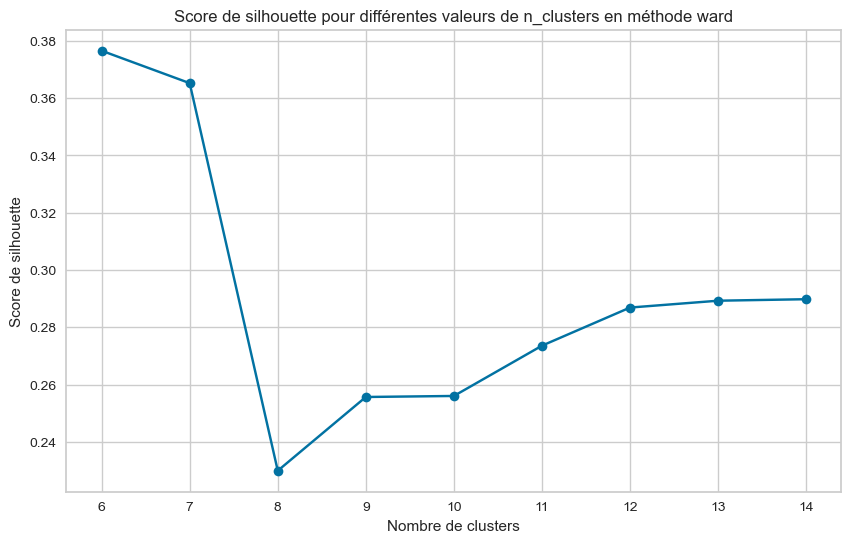

In [40]:
# Tracer le score de silhouette pour chaque nombre de clusters
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ward_silhouette_scores, marker='o')
plt.title('Score de silhouette pour différentes valeurs de n_clusters en méthode ward')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.show()

In [41]:
# Utiliser les centroids comme points de départ pour le clustering hiérarchique
agg = AgglomerativeClustering(n_clusters=12, linkage='ward').fit(kmeans_centroids)

# Assigner les clusters hiérarchiques à chaque centroid
hierarchical_clusters = agg.labels_

# Créer un mapping entre les clusters K-means et les clusters hiérarchiques
cluster_mapping = {i: hierarchical_clusters[i] for i in range(len(hierarchical_clusters))}

# Assigner les clusters hiérarchiques à chaque point dans les données d'origine
data['Cluster_hierar'] = [cluster_mapping[label] for label in kmeans.labels_]

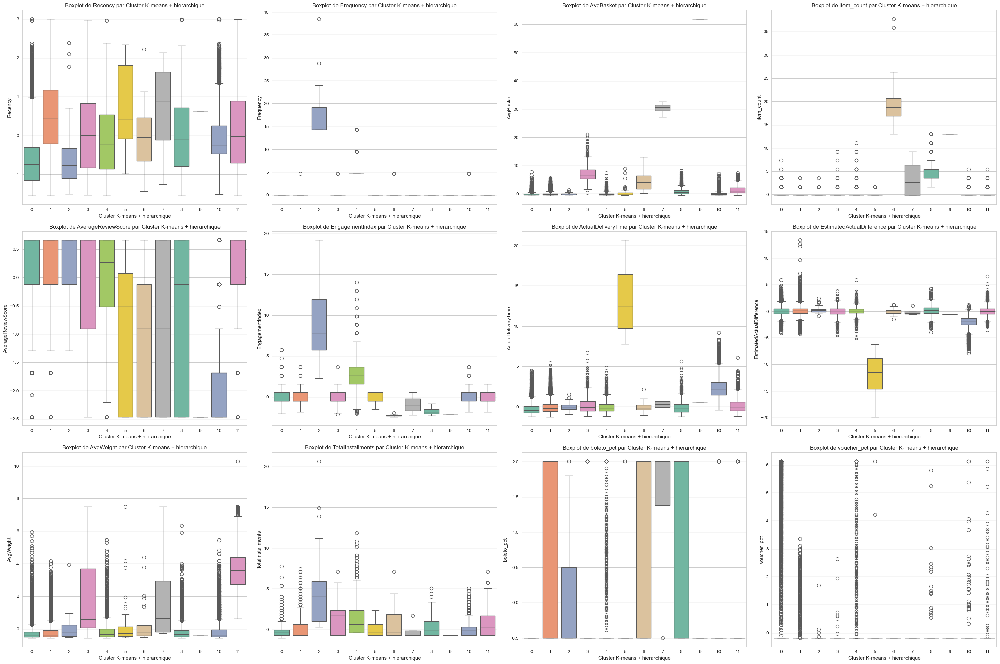

In [42]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_hierar', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_hierar', legend=False)
    ax.set_xlabel('Cluster K-means + hierarchique')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means + hierarchique")

# Affichez les graphiques
plt.tight_layout()
plt.show()

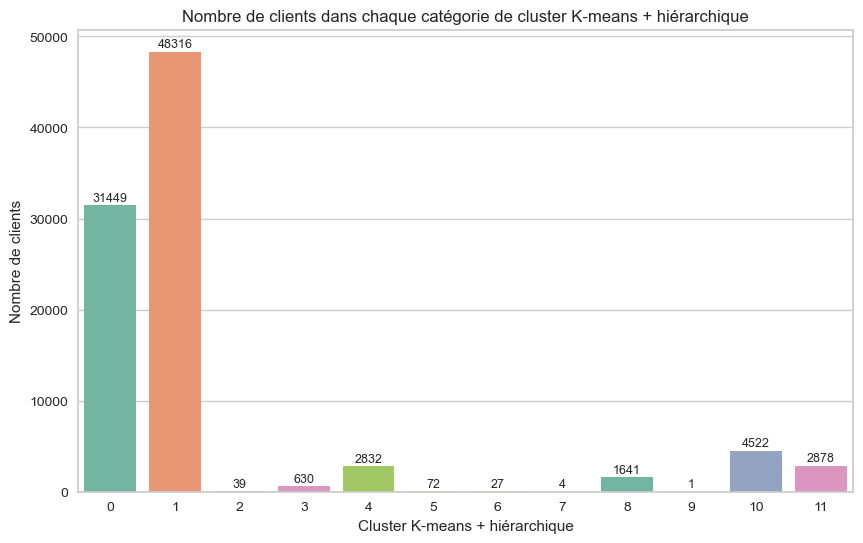

In [43]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_hierar'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index, legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster K-means + hiérarchique')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster K-means + hiérarchique')
plt.show()

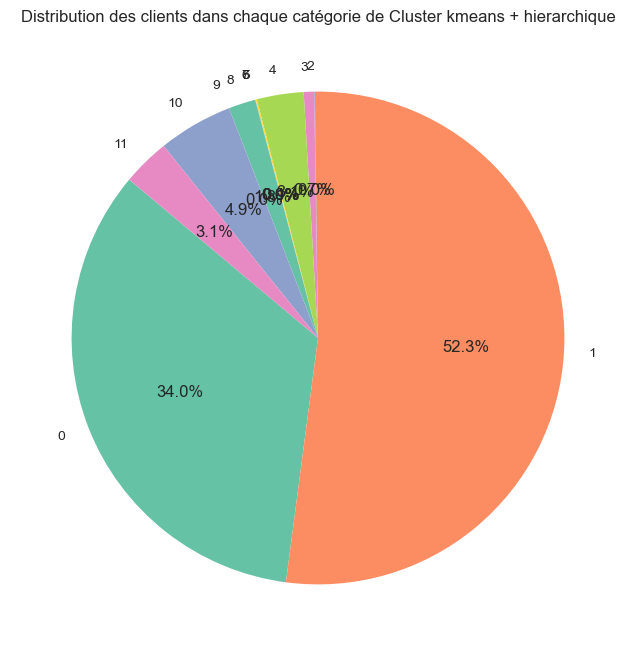

In [44]:
cluster_counts = data['Cluster_hierar'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster kmeans + hierarchique')
plt.show()

## Les clusters et profils

### Visualisation des clusters avec T-SNE

In [45]:
# Sélectionnez les caractéristiques pour t-SNE
X = data.drop(['Cluster_kmeans', 'Cluster_DB', 'Cluster_hierar'], axis=1)

# Initialiser et ajuster t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)


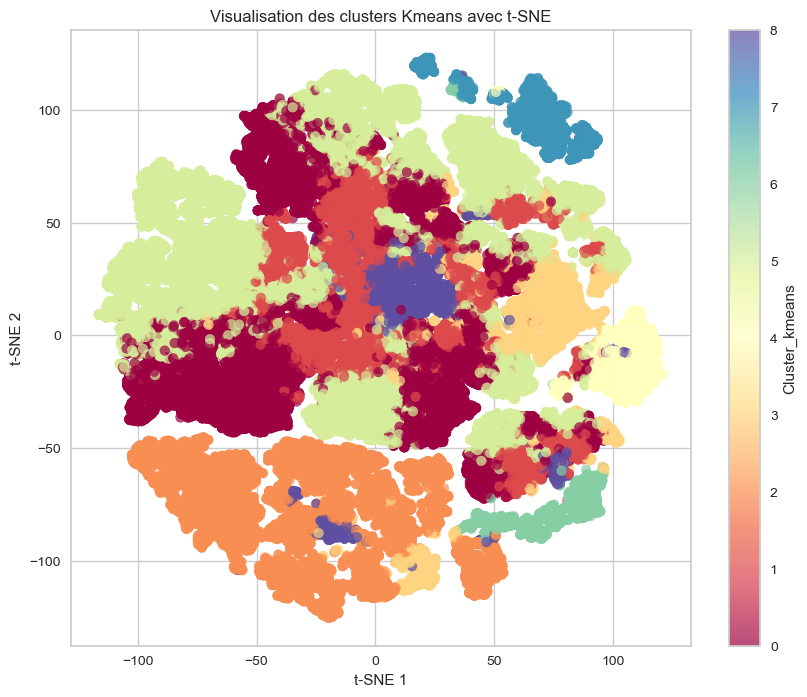

In [50]:
# Créer un scatter plot pour visualiser les clusters kmeans
plt.figure(figsize=(10, 8))
# colorer les points en fonction de leur cluster
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=data['Cluster_kmeans'], cmap='Spectral', alpha=0.7)

plt.title('Visualisation des clusters Kmeans avec t-SNE')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.colorbar(label='Cluster_kmeans')
plt.show()

In [51]:
# Initialiser et ajuster t-SNE pour la version 3d
tsne3d = TSNE(n_components=3, random_state=42)
X_tsne = tsne3d.fit_transform(X)


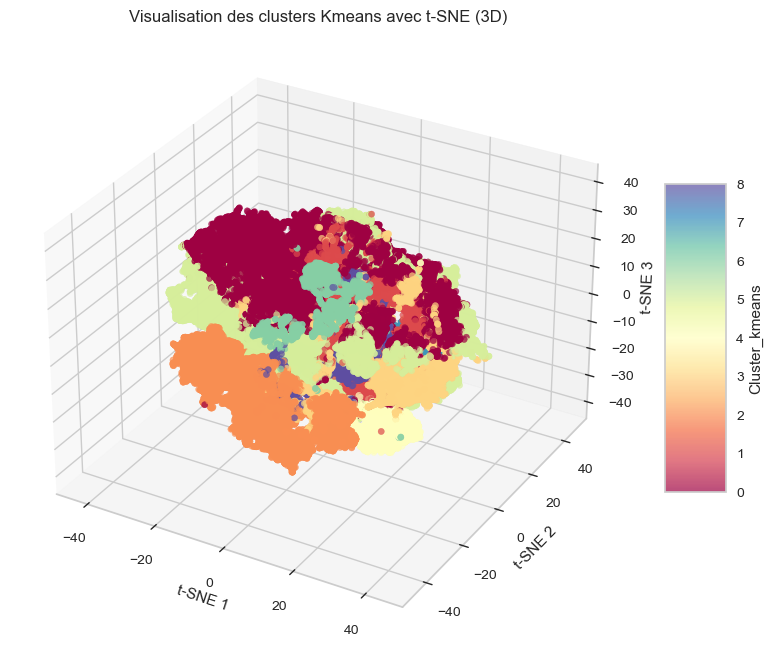

In [52]:
# Créer un scatter plot 3D pour visualiser les clusters kmeans
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Colorer les points en fonction de leur cluster
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=data['Cluster_kmeans'], cmap='Spectral', alpha=0.7)

# Ajouter des étiquettes et un titre
ax.set_title('Visualisation des clusters Kmeans avec t-SNE (3D)')
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')
ax.set_zlabel('t-SNE 3')

# Ajouter une barre de couleur pour indiquer les clusters
cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Cluster_kmeans')

plt.show()

### Profils K-means

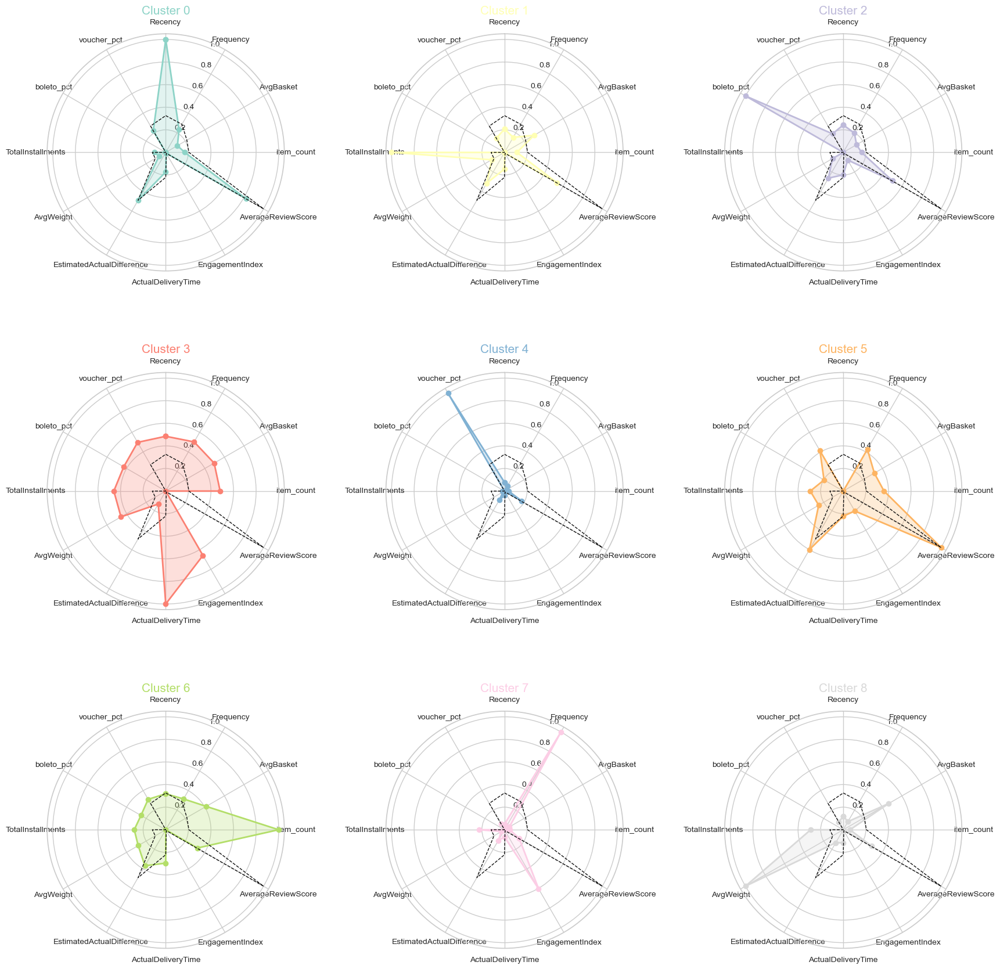

In [53]:
num_clusters = 9
palette = sns.color_palette("Set3", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_kmeans'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils DBSCAN

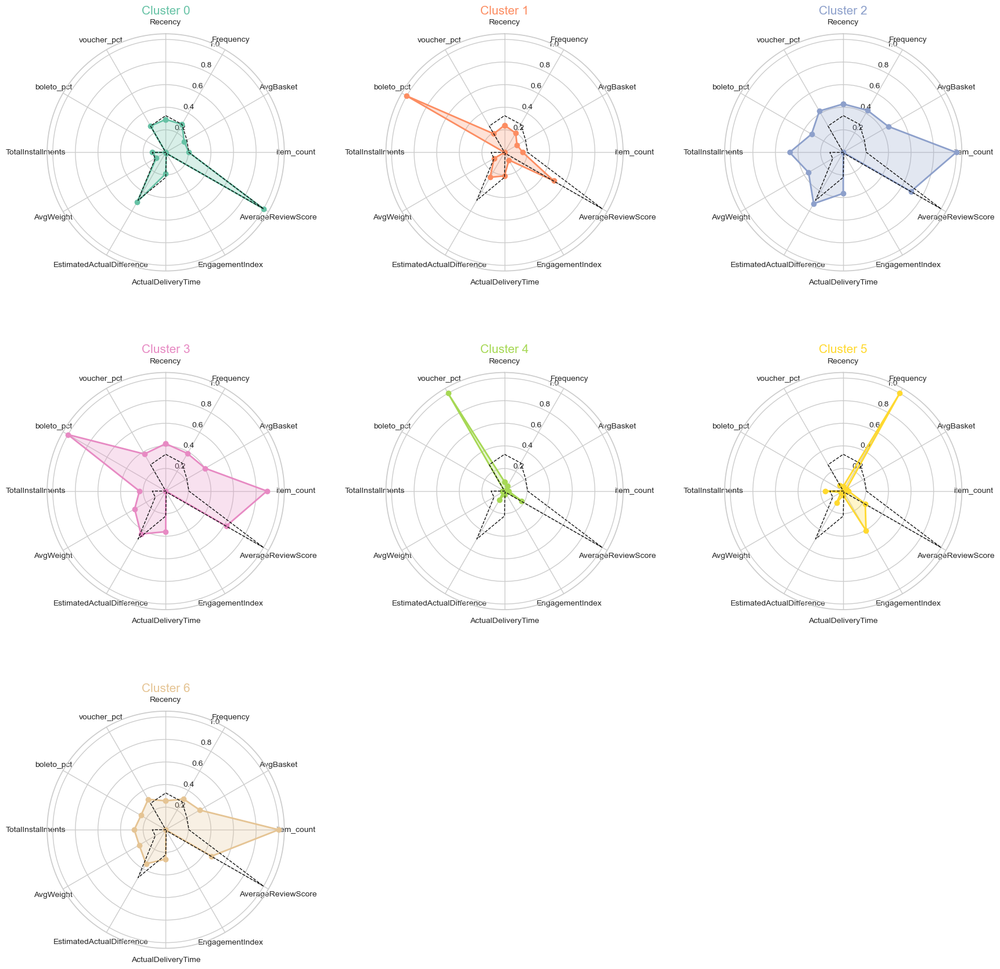

In [54]:
num_clusters = 7
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_DB'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils K-means + hierarchique

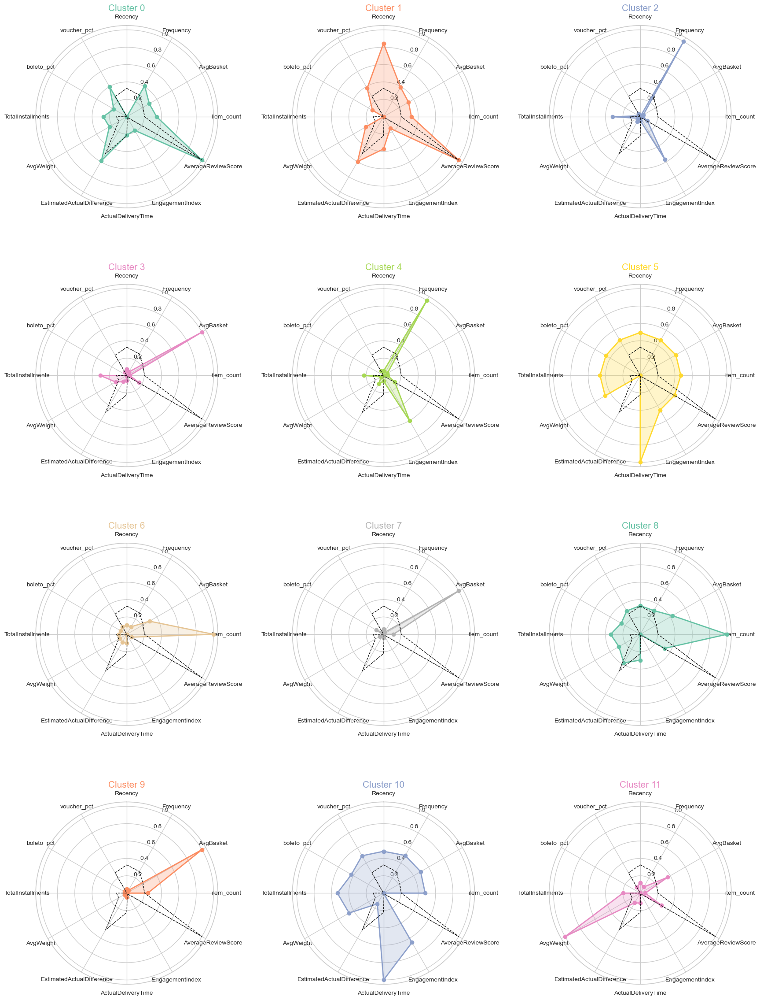

In [55]:
num_clusters = 12
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_hierar'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

# 10 indicateurs

In [56]:
# features à supprimer
data = data.drop(columns=[
    'ActualDeliveryTime',
    'AvgWeight',
    'Cluster_kmeans',
    'Cluster_DB',
    'Cluster_hierar'
])


In [57]:
data.columns.tolist()

['Recency',
 'Frequency',
 'AvgBasket',
 'item_count',
 'AverageReviewScore',
 'EngagementIndex',
 'EstimatedActualDifference',
 'TotalInstallments',
 'boleto_pct',
 'voucher_pct']

In [58]:
features = data.columns

## Test de différentes méthodes

### K-means

In [59]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=5, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

data.head()


,Recency,Frequency,AvgBasket,item_count,AverageReviewScore,EngagementIndex,EstimatedActualDifference,TotalInstallments,boleto_pct,voucher_pct,Cluster_kmeans
0,-0.823824,-0.166833,-0.083401,-0.262544,0.661413,1.581544,-0.700191,1.669969,-0.50049,-0.18714,1
1,-0.804152,-0.166833,-0.609331,-0.262544,-0.120032,-0.489226,-0.688748,-0.701200,-0.50049,-0.18714,1
2,1.963167,-0.166833,-0.338687,-0.262544,-0.901478,-0.489226,-0.972637,1.669969,-0.50049,-0.18714,2
3,0.546720,-0.166833,-0.534002,-0.262544,-0.120032,0.546159,-0.007344,0.315015,-0.50049,-0.18714,1
4,0.330318,-0.166833,0.168721,-0.262544,0.661413,-0.489226,-0.411915,0.992492,-0.50049,-0.18714,1


In [60]:
score = silhouette_score(data[features], data['Cluster_kmeans'], n_jobs=-1)
print('Silhouette Score:', score)


Silhouette Score: 0.2579328482867174


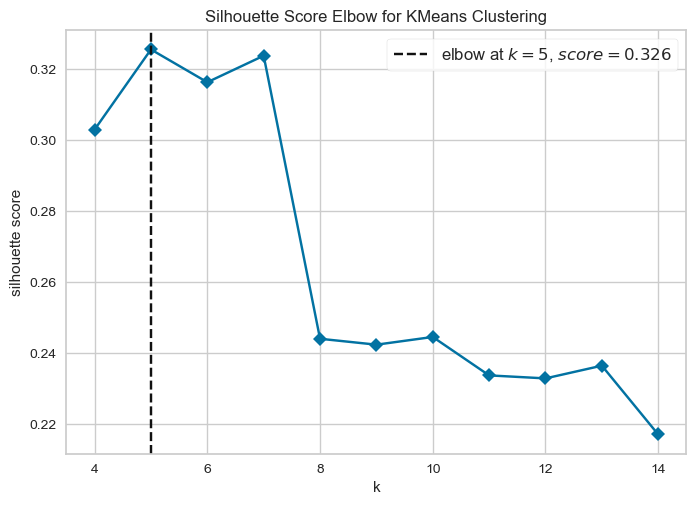

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [61]:
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,15), metric='silhouette', timings=False, n_jobs=-1)
visualizer.fit(data)    
visualizer.show()

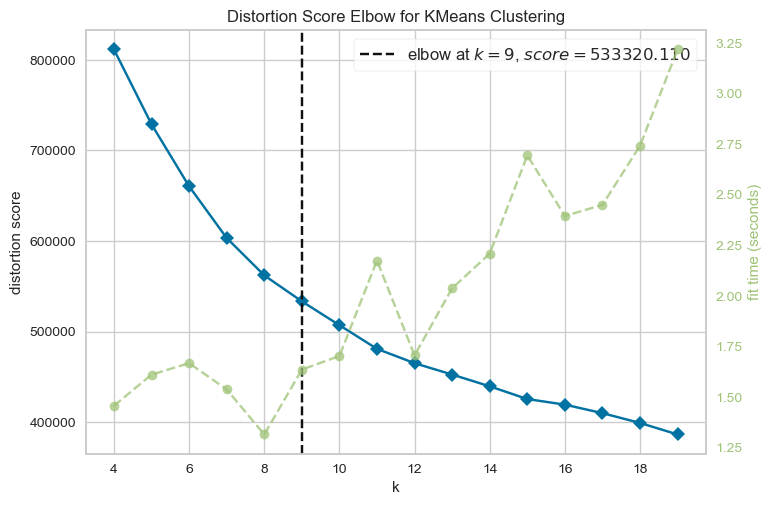

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [62]:
# distortion 
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,20))
visualizer.fit(X)   
visualizer.poof()   

In [63]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=10, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

In [64]:
# Calculer le score de Davies-Bouldin
X = data[features] 
labels = data['Cluster_kmeans'] 
davies_bouldin = davies_bouldin_score(X, labels)

print(f"Le score de Davies-Bouldin pour le clustering KMeans est : {davies_bouldin}")

Le score de Davies-Bouldin pour le clustering KMeans est : 1.1685021521388301


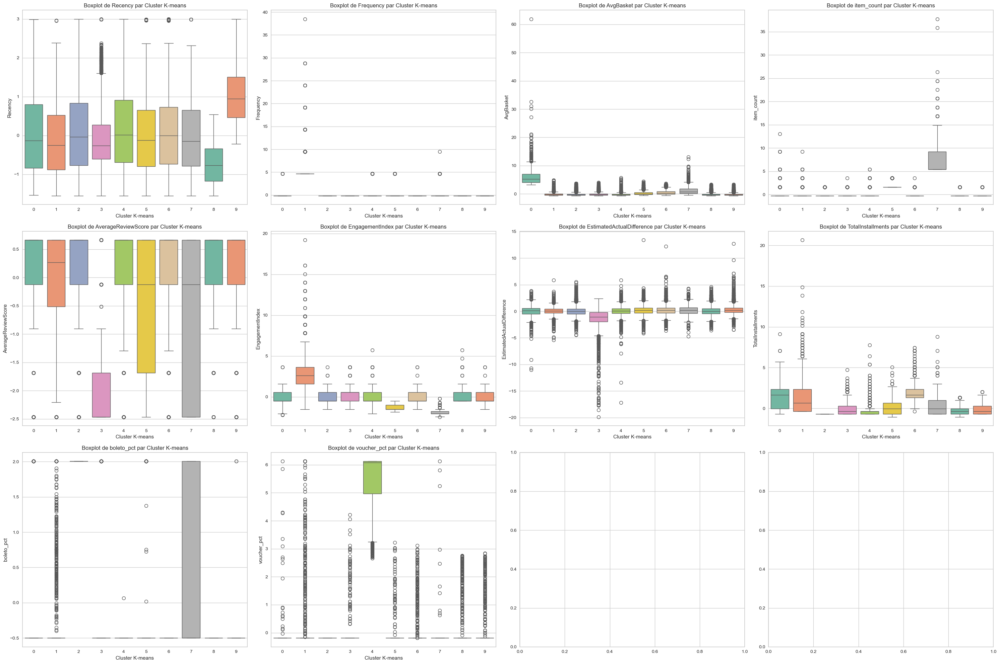

In [65]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_kmeans', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_kmeans', legend=False)
    ax.set_xlabel('Cluster K-means')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means")

# Affichez les graphiques
plt.tight_layout()
plt.show()


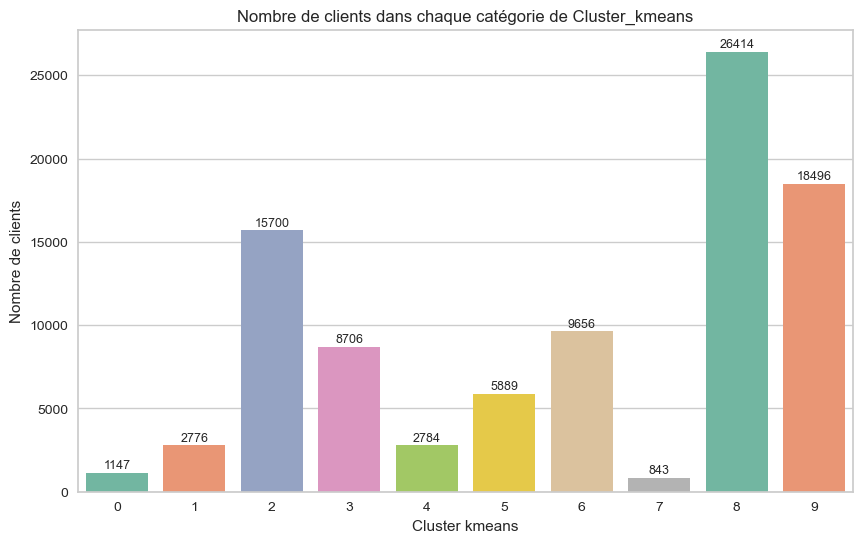

In [66]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_kmeans'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster kmeans')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de Cluster_kmeans')
plt.show()

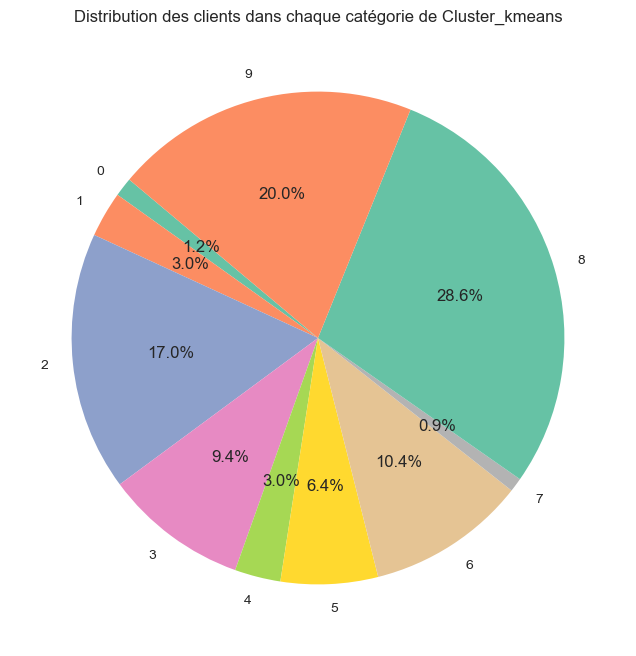

In [67]:
cluster_counts = data['Cluster_kmeans'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster_kmeans')
plt.show()

### DBSCAN

In [68]:
# Initialisation du modèle DBSCAN
dbscan = DBSCAN(eps=1.2, min_samples=200, n_jobs=-1)  
dbscan.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_DB'] = dbscan.labels_  # -1 signifie bruit


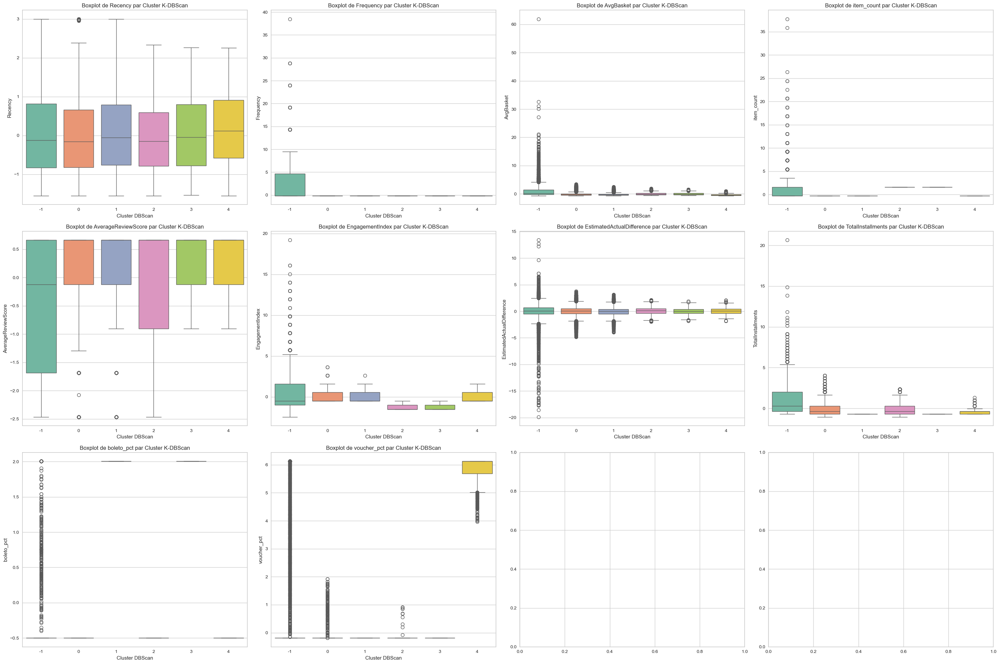

In [69]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_DB', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_DB', legend=False)
    ax.set_xlabel('Cluster DBScan')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-DBScan")

# Affichez les graphiques
plt.tight_layout()
plt.show()

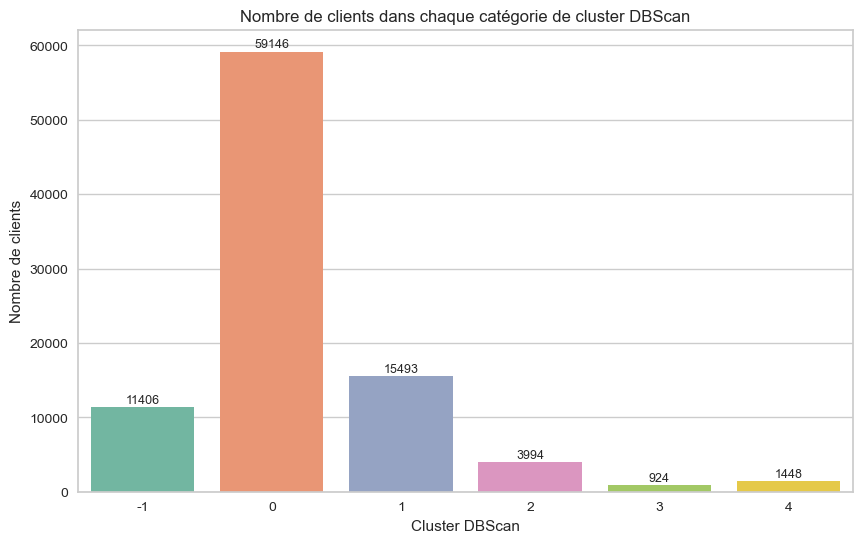

In [70]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_DB'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster DBScan')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster DBScan')

plt.show()

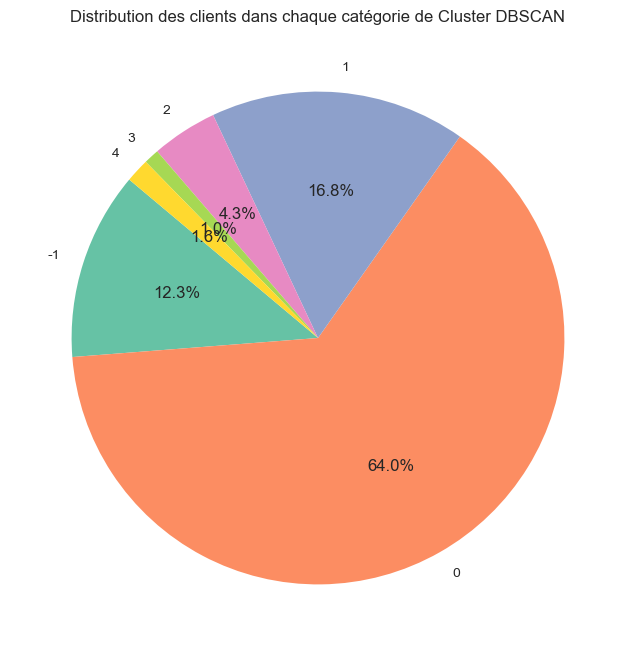

In [71]:
cluster_counts = data['Cluster_DB'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster DBSCAN')
plt.show()

### K-means + hierarchique

In [72]:
# Effectuer K-means avec 500 clusters
kmeans = KMeans(n_clusters=500, n_init=10, random_state=42)
kmeans.fit(data)

# Obtenir les centroids des clusters K-means
kmeans_centroids = kmeans.cluster_centers_

In [73]:
range_n_clusters = range(5, 18)  

In [74]:
# Ward
ward_silhouette_scores = []
for n_clusters in range_n_clusters:
    # Créer et ajuster le modèle AgglomerativeClustering
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(kmeans_centroids)
    
    # Calculer le score de silhouette
    silhouette_avg = silhouette_score(kmeans_centroids, cluster_labels)
    ward_silhouette_scores.append(silhouette_avg)
    print(f"Pour n_clusters = {n_clusters}, le score de silhouette moyen est : {silhouette_avg}")

Pour n_clusters = 5, le score de silhouette moyen est : 0.27501368547399185
Pour n_clusters = 6, le score de silhouette moyen est : 0.2914958405363659
Pour n_clusters = 7, le score de silhouette moyen est : 0.27744325889058946
Pour n_clusters = 8, le score de silhouette moyen est : 0.2614862491350201
Pour n_clusters = 9, le score de silhouette moyen est : 0.26813031967194517
Pour n_clusters = 10, le score de silhouette moyen est : 0.2827107961497221
Pour n_clusters = 11, le score de silhouette moyen est : 0.2901993034412303
Pour n_clusters = 12, le score de silhouette moyen est : 0.308279820248845
Pour n_clusters = 13, le score de silhouette moyen est : 0.3080015989659179
Pour n_clusters = 14, le score de silhouette moyen est : 0.31177462820566676
Pour n_clusters = 15, le score de silhouette moyen est : 0.31398030232847873
Pour n_clusters = 16, le score de silhouette moyen est : 0.3098876851573807
Pour n_clusters = 17, le score de silhouette moyen est : 0.3102217044801618


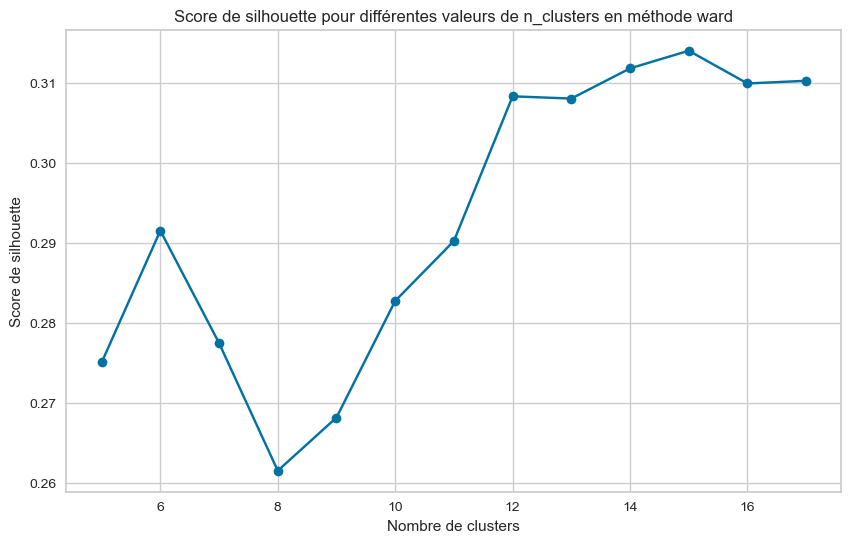

In [75]:
# Tracer le score de silhouette pour chaque nombre de clusters
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ward_silhouette_scores, marker='o')
plt.title('Score de silhouette pour différentes valeurs de n_clusters en méthode ward')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.show()

In [76]:
# Utiliser les centroids comme points de départ pour le clustering hiérarchique
agg = AgglomerativeClustering(n_clusters=15, linkage='ward').fit(kmeans_centroids)

# Assigner les clusters hiérarchiques à chaque centroid
hierarchical_clusters = agg.labels_

# Créer un mapping entre les clusters K-means et les clusters hiérarchiques
cluster_mapping = {i: hierarchical_clusters[i] for i in range(len(hierarchical_clusters))}

# Assigner les clusters hiérarchiques à chaque point dans les données d'origine
data['Cluster_hierar'] = [cluster_mapping[label] for label in kmeans.labels_]

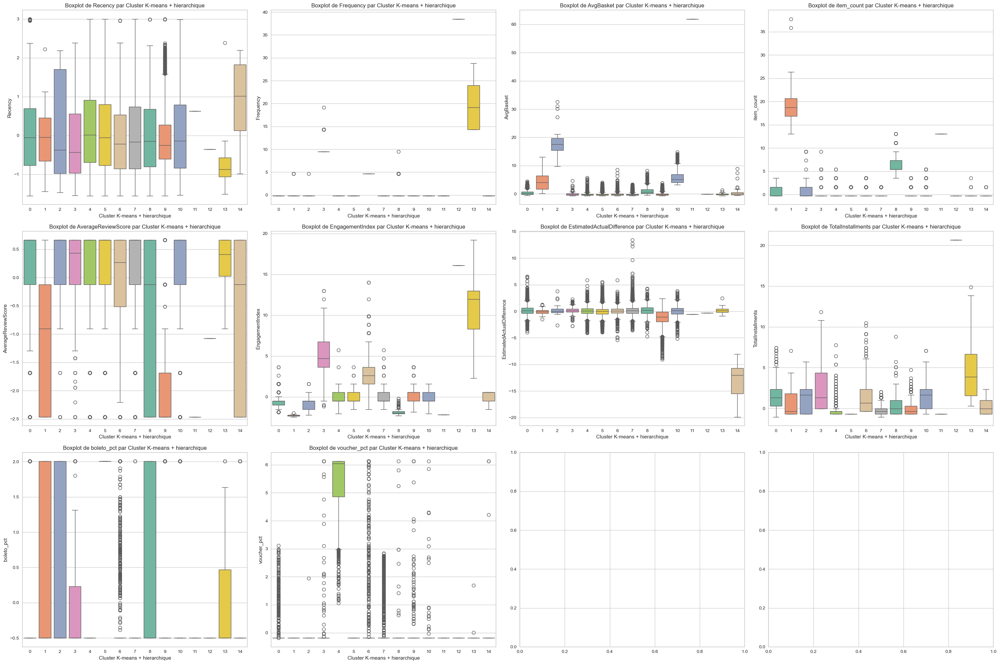

In [77]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(30,20))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_hierar', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_hierar', legend=False)
    ax.set_xlabel('Cluster K-means + hierarchique')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means + hierarchique")

# Affichez les graphiques
plt.tight_layout()
plt.show()

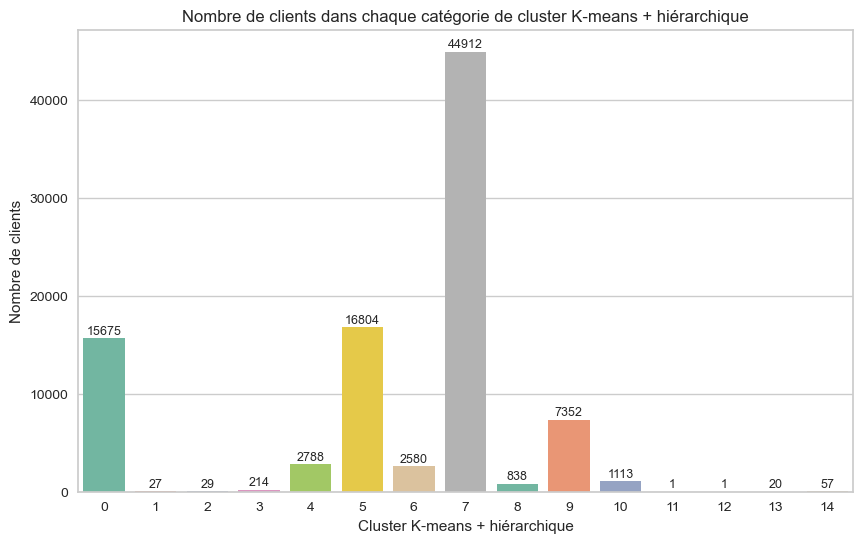

In [78]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_hierar'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index, legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster K-means + hiérarchique')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster K-means + hiérarchique')
plt.show()

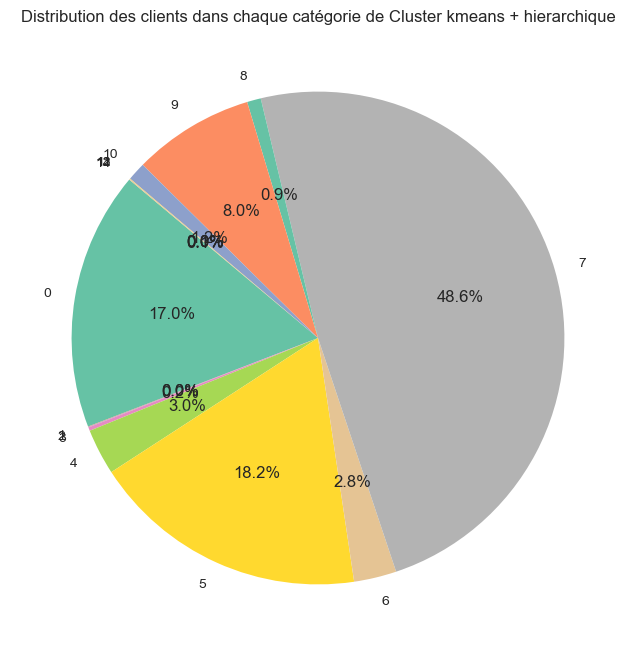

In [79]:
cluster_counts = data['Cluster_hierar'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster kmeans + hierarchique')
plt.show()

## Les clusters et profils

### Visualisation des clusters avec T-SNE

### Profils K-means

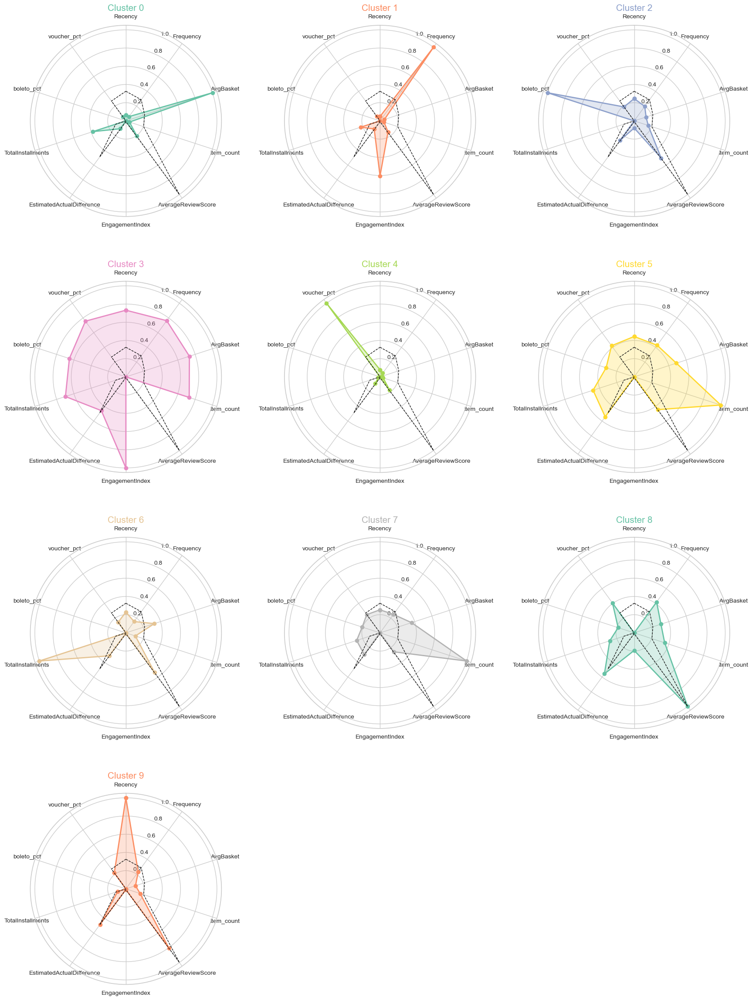

In [80]:
num_clusters = 10
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_kmeans'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils DBSCAN

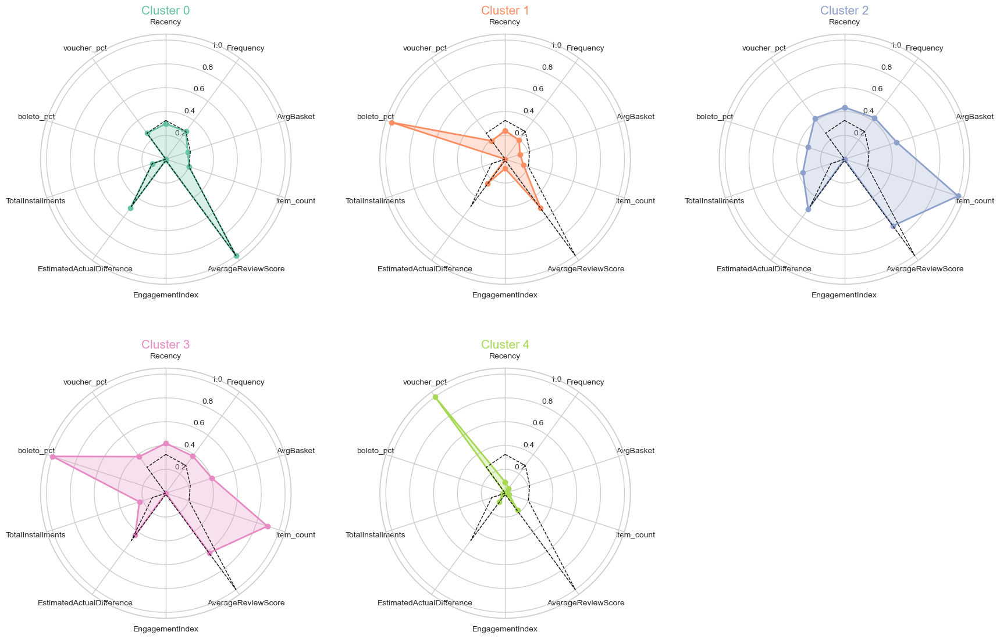

In [81]:
num_clusters = 5
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_DB'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils K-means + hierarchique

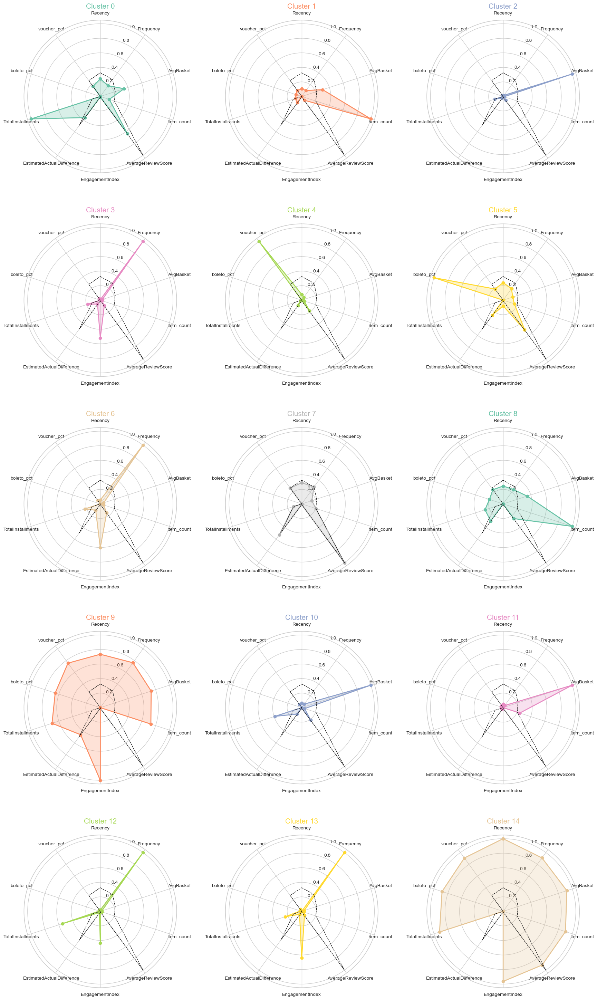

In [82]:
num_clusters = 15
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_hierar'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

# 5 indicateurs

In [83]:
# features à supprimer
data = data.drop(columns=[
    'EstimatedActualDifference',
    'boleto_pct',
    'voucher_pct',
    'Cluster_kmeans',
    'Cluster_DB',
    'Cluster_hierar',
    'TotalInstallments'
])


In [84]:
data.columns.tolist()

['Recency',
 'Frequency',
 'AvgBasket',
 'item_count',
 'AverageReviewScore',
 'EngagementIndex']

In [85]:
features = data.columns

## Test de différentes méthodes

### K-means

In [86]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=5, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

data.head()


,Recency,Frequency,AvgBasket,item_count,AverageReviewScore,EngagementIndex,Cluster_kmeans
0,-0.823824,-0.166833,-0.083401,-0.262544,0.661413,1.581544,2
1,-0.804152,-0.166833,-0.609331,-0.262544,-0.120032,-0.489226,2
2,1.963167,-0.166833,-0.338687,-0.262544,-0.901478,-0.489226,1
3,0.546720,-0.166833,-0.534002,-0.262544,-0.120032,0.546159,1
4,0.330318,-0.166833,0.168721,-0.262544,0.661413,-0.489226,1


In [87]:
score = silhouette_score(data[features], data['Cluster_kmeans'], n_jobs=-1)
print('Silhouette Score:', score)


Silhouette Score: 0.2929577372189455


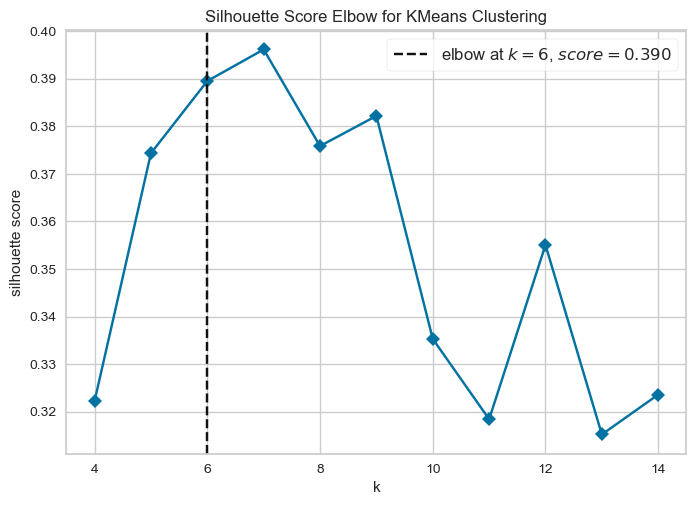

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [88]:
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,15), metric='silhouette', timings=False, n_jobs=-1)
visualizer.fit(data)    
visualizer.show()

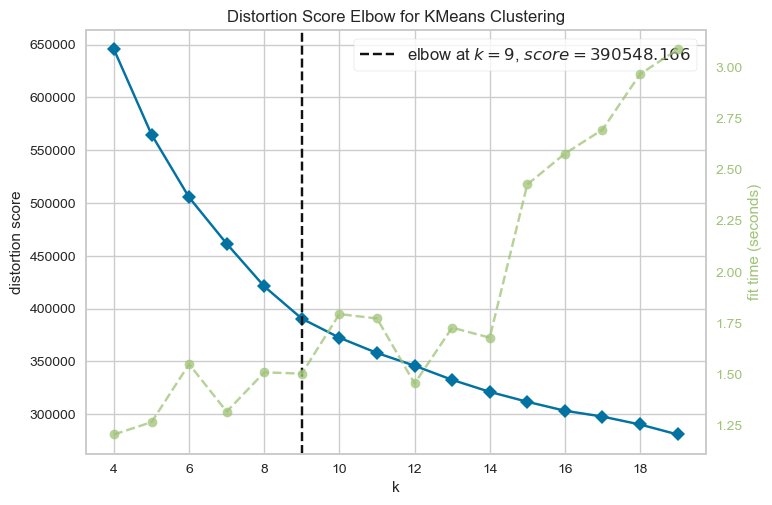

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [89]:
# distortion 
visualizer = KElbowVisualizer(KMeans(random_state=42, n_init=10), k=(4,20))
visualizer.fit(X)   
visualizer.poof()   

In [90]:
# Initialisation du modèle KMeans
kmeans = KMeans(n_clusters=8, random_state=42,n_init=10)
kmeans.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_kmeans'] = kmeans.labels_

In [91]:
# Calculer le score de Davies-Bouldin
X = data[features] 
labels = data['Cluster_kmeans'] 
davies_bouldin = davies_bouldin_score(X, labels)

print(f"Le score de Davies-Bouldin pour le clustering KMeans est : {davies_bouldin}")

Le score de Davies-Bouldin pour le clustering KMeans est : 0.9467195774540581


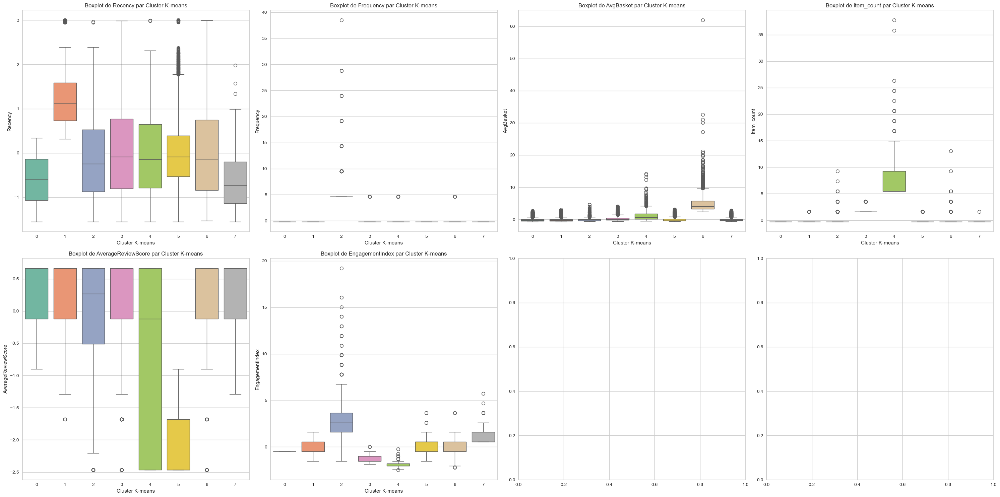

In [92]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(30,15))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_kmeans', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_kmeans', legend=False)
    ax.set_xlabel('Cluster K-means')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means")

# Affichez les graphiques
plt.tight_layout()
plt.show()


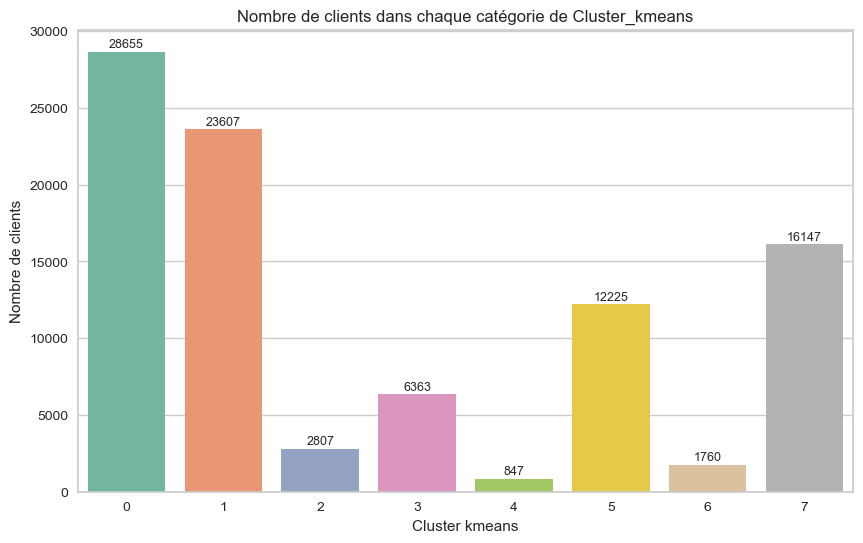

In [93]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_kmeans'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster kmeans')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de Cluster_kmeans')
plt.show()

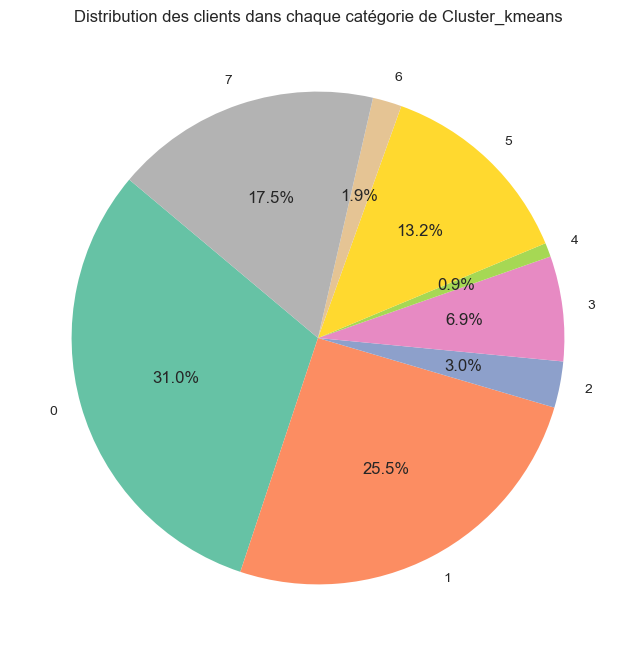

In [94]:
cluster_counts = data['Cluster_kmeans'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster_kmeans')
plt.show()

### DBSCAN

In [95]:
# Initialisation du modèle DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=600, n_jobs=-1)  # eps et min_samples doivent être ajustés
dbscan.fit(data[features])

# Récupération des étiquettes de cluster pour chaque point de données
data['Cluster_DB'] = dbscan.labels_  # -1 signifie bruit


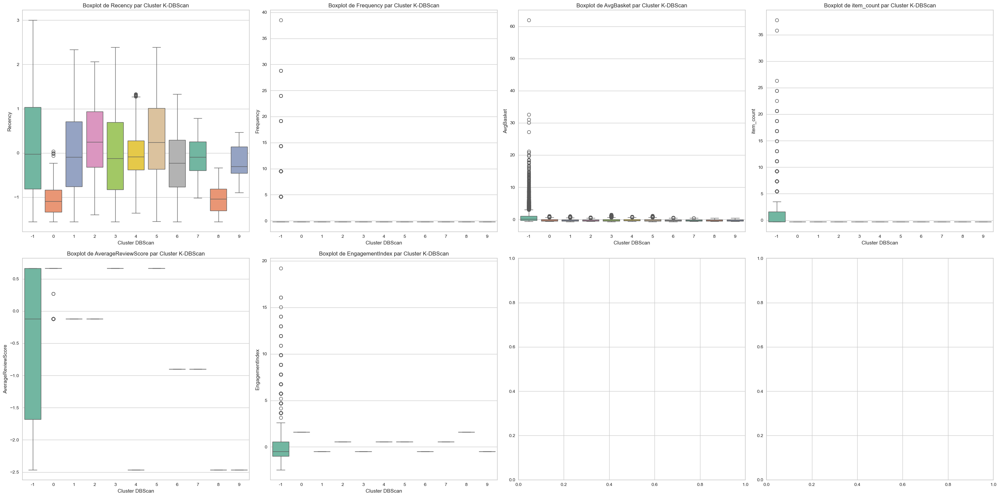

In [96]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(30,15))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_DB', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_DB', legend=False)
    ax.set_xlabel('Cluster DBScan')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-DBScan")

# Affichez les graphiques
plt.tight_layout()
plt.show()

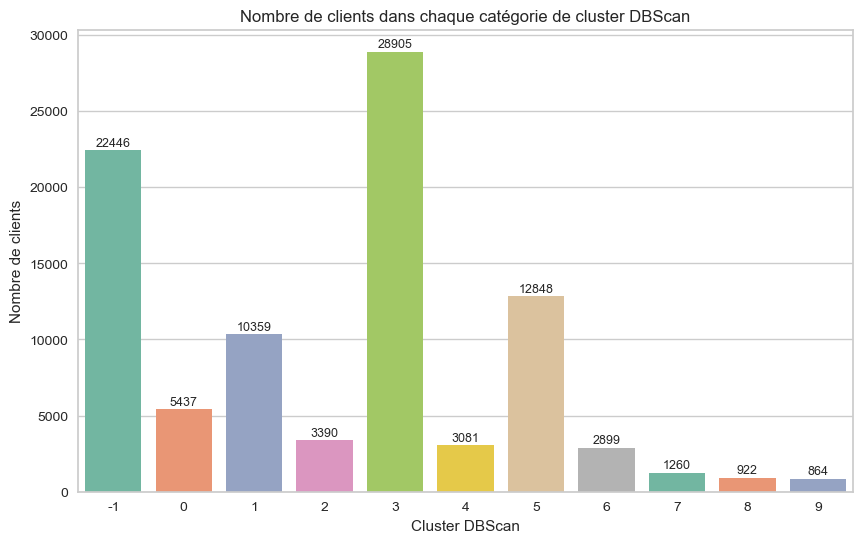

In [97]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_DB'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index,legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster DBScan')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster DBScan')

plt.show()

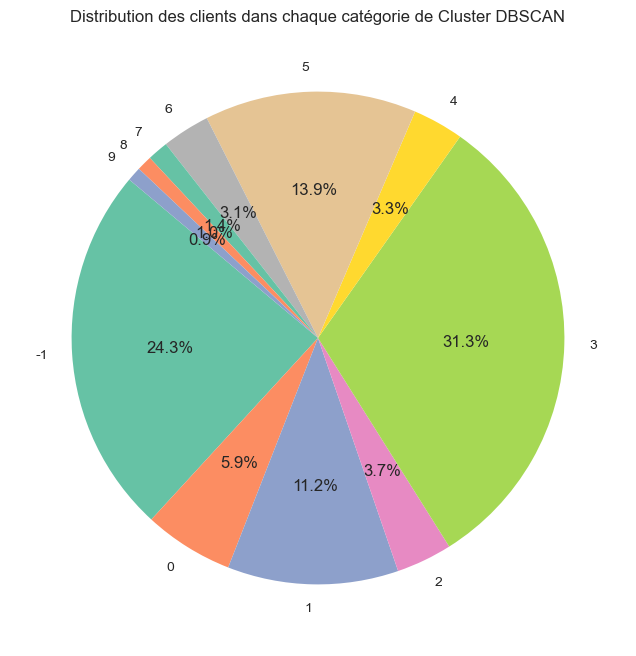

In [98]:
cluster_counts = data['Cluster_DB'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster DBSCAN')
plt.show()

### K-means + hierarchique

In [99]:
# Effectuer K-means avec 500 clusters
kmeans = KMeans(n_clusters=500, n_init=10, random_state=42)
kmeans.fit(data)

# Obtenir les centroids des clusters K-means
kmeans_centroids = kmeans.cluster_centers_

In [100]:
range_n_clusters = range(5, 18)  

In [101]:
# Ward
ward_silhouette_scores = []
for n_clusters in range_n_clusters:
    # Créer et ajuster le modèle AgglomerativeClustering
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(kmeans_centroids)
    
    # Calculer le score de silhouette
    silhouette_avg = silhouette_score(kmeans_centroids, cluster_labels)
    ward_silhouette_scores.append(silhouette_avg)
    print(f"Pour n_clusters = {n_clusters}, le score de silhouette moyen est : {silhouette_avg}")

Pour n_clusters = 5, le score de silhouette moyen est : 0.3258903676800576
Pour n_clusters = 6, le score de silhouette moyen est : 0.28834364509007093
Pour n_clusters = 7, le score de silhouette moyen est : 0.2915939169962593
Pour n_clusters = 8, le score de silhouette moyen est : 0.2982298683874235
Pour n_clusters = 9, le score de silhouette moyen est : 0.2902917194484103
Pour n_clusters = 10, le score de silhouette moyen est : 0.3259878024728878
Pour n_clusters = 11, le score de silhouette moyen est : 0.3321580527701679
Pour n_clusters = 12, le score de silhouette moyen est : 0.3361248273340751
Pour n_clusters = 13, le score de silhouette moyen est : 0.3480729753890987
Pour n_clusters = 14, le score de silhouette moyen est : 0.35061051334105137
Pour n_clusters = 15, le score de silhouette moyen est : 0.347285809393683
Pour n_clusters = 16, le score de silhouette moyen est : 0.34142630268697544
Pour n_clusters = 17, le score de silhouette moyen est : 0.3341017259782853


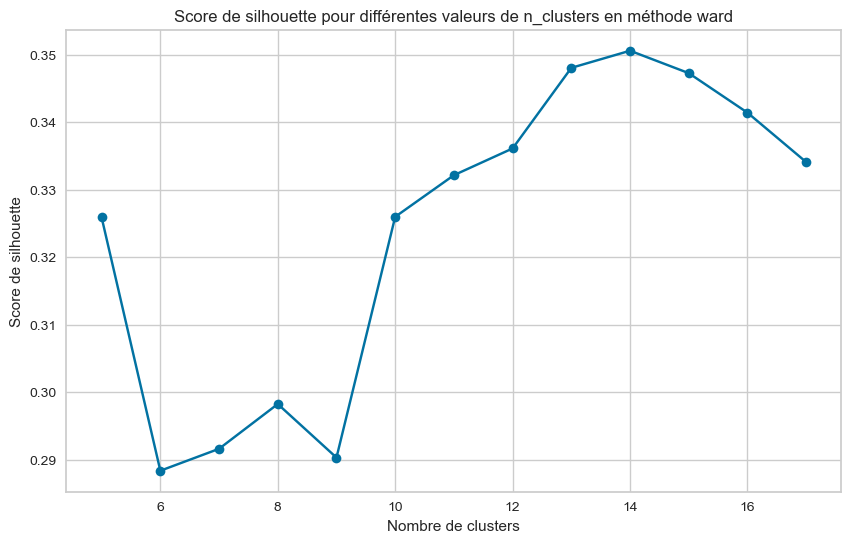

In [102]:
# Tracer le score de silhouette pour chaque nombre de clusters
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ward_silhouette_scores, marker='o')
plt.title('Score de silhouette pour différentes valeurs de n_clusters en méthode ward')
plt.xlabel('Nombre de clusters')
plt.ylabel('Score de silhouette')
plt.show()

In [103]:
# Utiliser les centroids comme points de départ pour le clustering hiérarchique
agg = AgglomerativeClustering(n_clusters=11, linkage='ward').fit(kmeans_centroids)

# Assigner les clusters hiérarchiques à chaque centroid
hierarchical_clusters = agg.labels_

# Créer un mapping entre les clusters K-means et les clusters hiérarchiques
cluster_mapping = {i: hierarchical_clusters[i] for i in range(len(hierarchical_clusters))}

# Assigner les clusters hiérarchiques à chaque point dans les données d'origine
data['Cluster_hierar'] = [cluster_mapping[label] for label in kmeans.labels_]

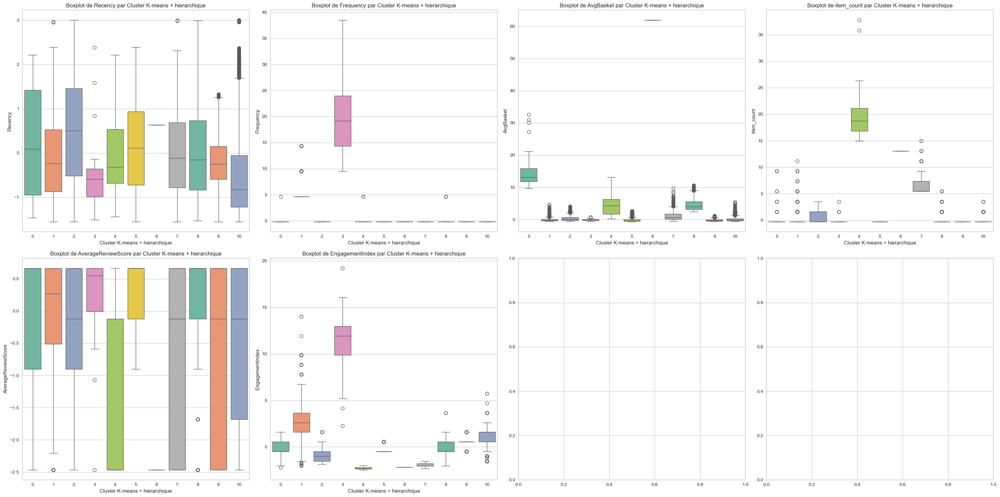

In [104]:
# Créer un boxplot pour chaque variable du dataframe en fonction des clusters
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(30,15))
axs = axs.flatten()

for ax, column in zip(axs, features):
    sns.boxplot(x='Cluster_hierar', y=column, data=data, ax=ax, palette='Set2', hue='Cluster_hierar', legend=False)
    ax.set_xlabel('Cluster K-means + hierarchique')
    ax.set_ylabel(column)
    ax.set_title(f"Boxplot de {column} par Cluster K-means + hierarchique")

# Affichez les graphiques
plt.tight_layout()
plt.show()

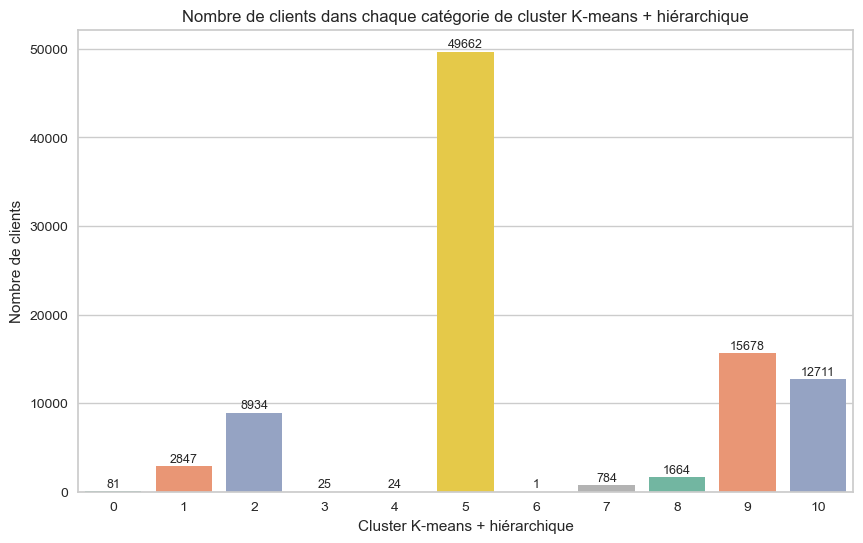

In [105]:
# Calculer le nombre de clients dans chaque catégorie de cluster
cluster_counts = data['Cluster_hierar'].value_counts()

# Créer un graphique à barres pour afficher le nombre de clients par catégorie de cluster
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='Set2', hue=cluster_counts.index, legend=False)

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     size=9, xytext = (0, 5), 
                     textcoords = 'offset points')

plt.xlabel('Cluster K-means + hiérarchique')
plt.ylabel('Nombre de clients')
plt.title('Nombre de clients dans chaque catégorie de cluster K-means + hiérarchique')
plt.show()

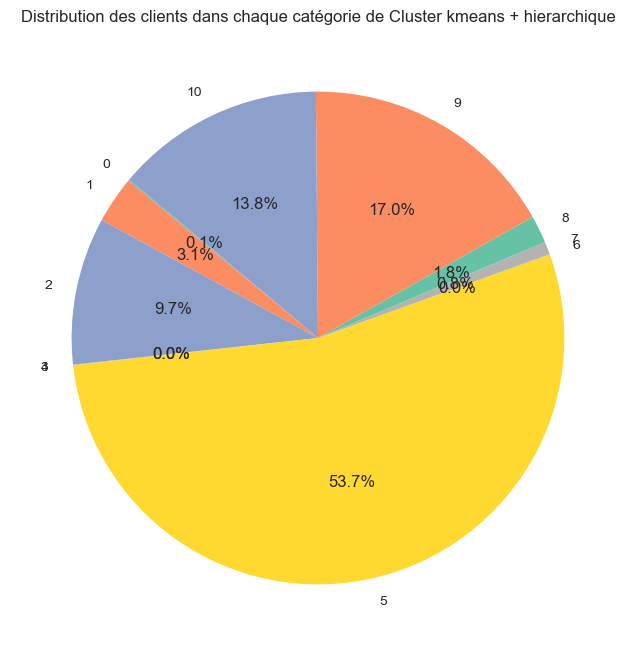

In [106]:
cluster_counts = data['Cluster_hierar'].value_counts().sort_index()

# Créer un graphique en camembert pour afficher le pourcentage de clients par catégorie de cluster
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2', len(cluster_counts)))
plt.title('Distribution des clients dans chaque catégorie de Cluster kmeans + hierarchique')
plt.show()

## Les clusters et profils

### Visualisation des clusters avec T-SNE

### Profils K-means

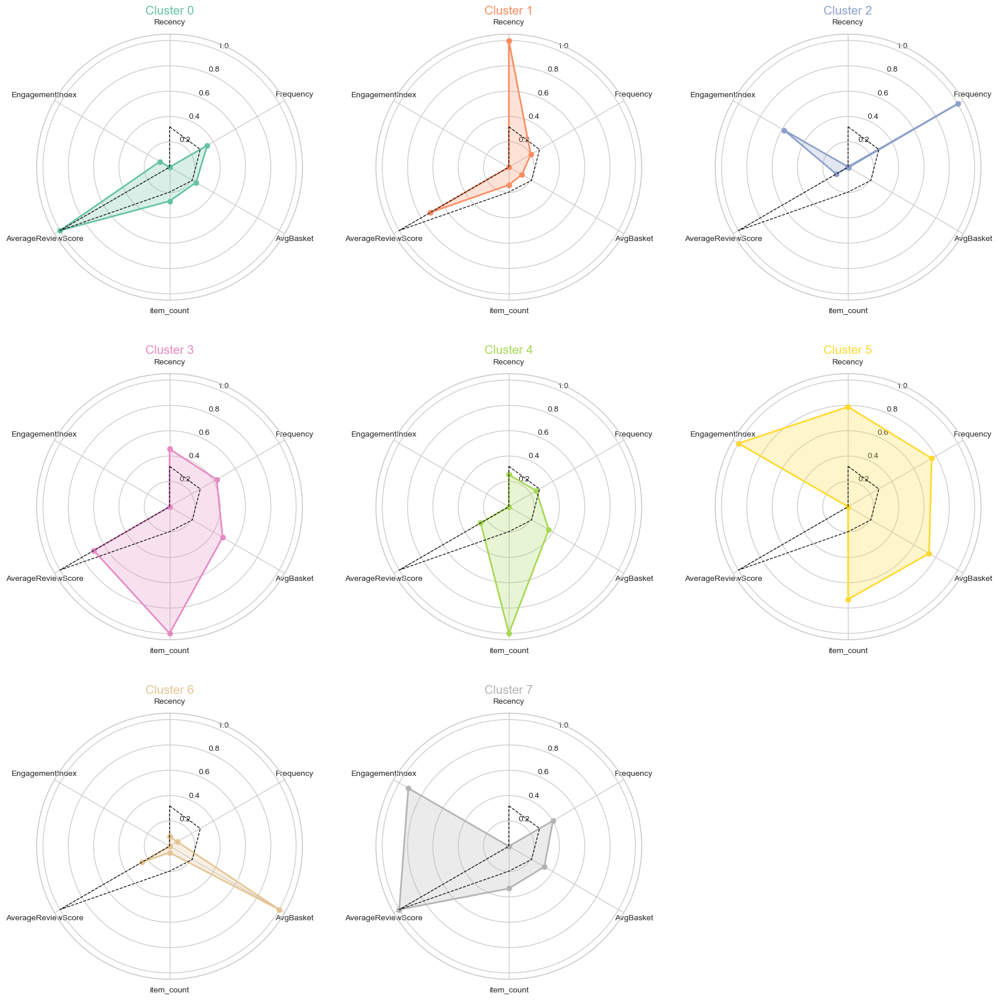

In [107]:
num_clusters = 8
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_kmeans'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils DBSCAN

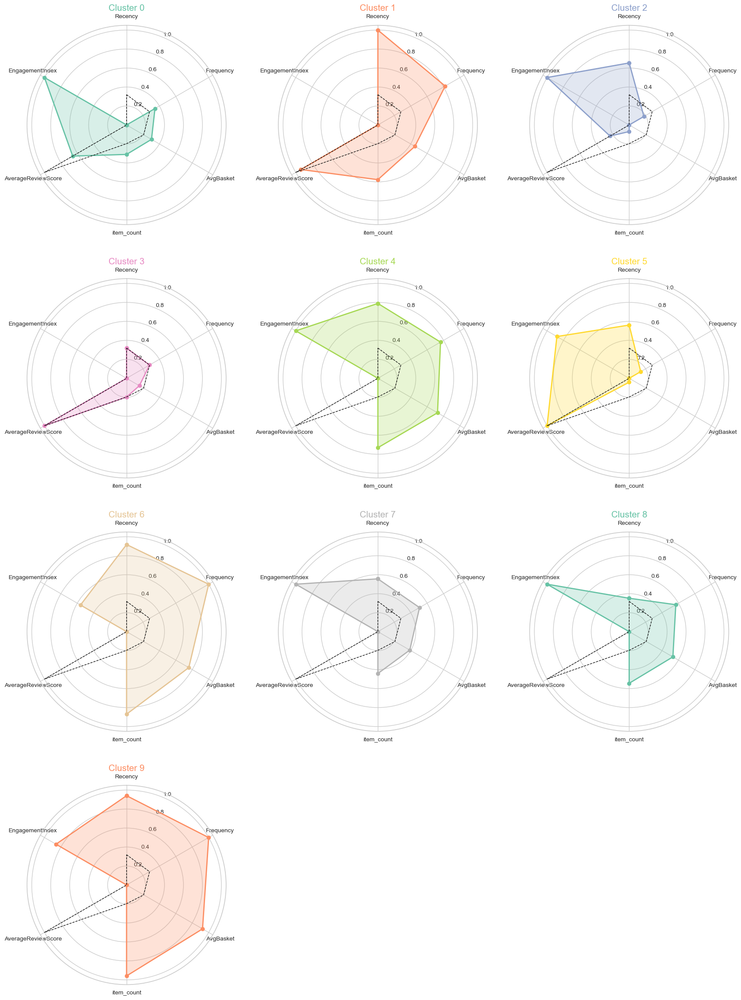

In [108]:
num_clusters = 10
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_DB'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()

### Profils K-means + hierarchique

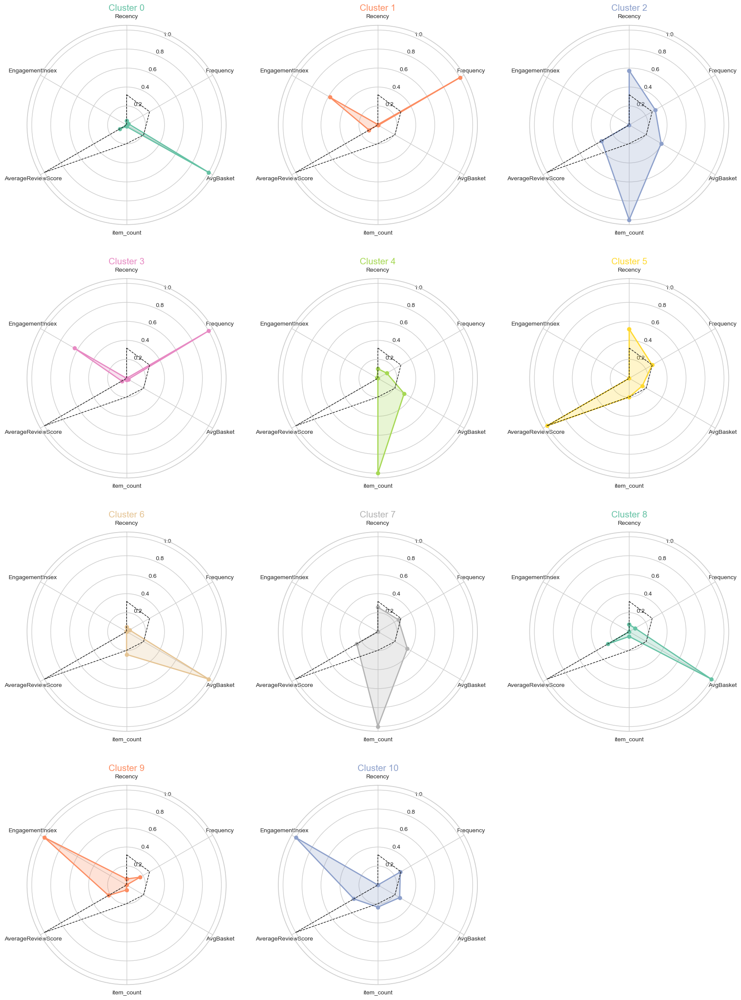

In [109]:
num_clusters = 11
palette = sns.color_palette("Set2", num_clusters)

# Calculer la médiane globale de chaque caractéristique
global_medians = data[features].median()
normalized_global_medians = (global_medians - global_medians.min()) / (global_medians.max() - global_medians.min())
global_values = normalized_global_medians.values.tolist()
global_values += global_values[:1]

# Calculer les angles pour chaque axe dans le radar
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Fermeture du cercle

# Définir le nombre de lignes et de colonnes pour la grille de subplots
num_columns = 3
num_rows = ceil(num_clusters / num_columns)

# Créer une grande figure pour accueillir tous les subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), subplot_kw=dict(polar=True))

# Aplatir le tableau d'axes pour un accès plus facile
axs = axs.ravel()

for cluster in range(num_clusters):
    # Sélectionner les données du cluster courant
    cluster_data = data[data['Cluster_hierar'] == cluster]
    
    # Calculer les valeurs normalisées pour le cluster
    normalized_values = cluster_data[features].median()
    normalized_values = (normalized_values - normalized_values.min()) / (normalized_values.max() - normalized_values.min())
    values = normalized_values.values.tolist()
    values += values[:1]  # Fermeture du cercle

    # Tracer le radar plot pour le cluster
    axs[cluster].plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster}', color=palette[cluster])
    axs[cluster].fill(angles, values, alpha=0.25, color=palette[cluster])
    
    # Tracer la ligne en pointillés pour la médiane globale
    axs[cluster].plot(angles, global_values, 'k--', linewidth=1, label='Médiane globale')
    
    # Configuration du subplot
    axs[cluster].set_theta_offset(np.pi / 2)
    axs[cluster].set_theta_direction(-1)
    axs[cluster].set_xticks(angles[:-1])
    axs[cluster].set_xticklabels(features, fontsize=10)
    axs[cluster].set_title(f'Cluster {cluster}', size=15, color=palette[cluster])

# Cacher les axes inutilisés si le nombre total de subplots dépasse le nombre de clusters
for i in range(num_clusters, num_rows * num_columns):
    fig.delaxes(axs[i])

fig.tight_layout(pad=3.0)
plt.show()